# Helmet Mapping + Deepsort

In this notebook:
1. I introduce a package `helmet_assignment` which includes some helper code.
2. I show how `deepsort` can be applied to post process exsiting predictions.

Postprocessing is applied to the baseline predictions from [this amazing starter notebook](https://www.kaggle.com/its7171/nfl-baseline-simple-helmet-mapping).



# "helmet_assignment" package provides helper code.

This package includes helpful functions like`NFLAssignmentScorer`, `check_submission` and `add_track_features`.

- dataset: https://www.kaggle.com/robikscube/helmet-assignment-helpers
- github: https://github.com/RobMulla/helmet-assignment

In [1]:
import os
import sys
sys.path.append('../input/nfl-health-and-safety-helmet-assignment')
os.path.exists('../input/nfl-health-and-safety-helmet-assignment')

True

In [2]:
# Install helmet-assignment helper code
!pip install ../input/helmet-assignment-helpers/helmet-assignment-main/ > /dev/null 2>&1
from helmet_assignment.score import NFLAssignmentScorer, check_submission
from helmet_assignment.features import add_track_features


# Baseline helmet mapping
This section uses the simple helmet mapping approach from the awesome notebook:

https://www.kaggle.com/its7171/nfl-baseline-simple-helmet-mapping

In [3]:
import numpy as np
import pandas as pd
import itertools
import glob
import os
import cv2
from sklearn.metrics import accuracy_score
from tqdm.auto import tqdm
from multiprocessing import Pool
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
import random

## Settings and loading data

Note I've extracted `max_iter`, `DIG_STEP` and `DIG_MAX` to the top for easy experimentation. I've also modified the code to run in debug mode if running on the public test set.

In [4]:
n_test_videos = len(os.listdir('../input/nfl-health-and-safety-helmet-assignment/test'))
# Run in debug mode unless during submission
if n_test_videos == 6:
    debug = True
else:
    debug = False

# Configurables
n_debug_samples = 1
random_state = 42
CONF_THRE = 0.3
max_iter = 1000
DIG_STEP = 3
DIG_MAX = DIG_STEP*10
# Read in the data AGAIN.

BASE_DIR = '../input/nfl-health-and-safety-helmet-assignment'

labels = pd.read_csv(f'{BASE_DIR}/train_labels.csv')
if debug:
    tracking = pd.read_csv(f'{BASE_DIR}/train_player_tracking.csv')
    helmets = pd.read_csv(f'{BASE_DIR}/train_baseline_helmets.csv')
else:
    tracking = pd.read_csv(f'{BASE_DIR}/test_player_tracking.csv')
    helmets = pd.read_csv(f'{BASE_DIR}/test_baseline_helmets.csv')
    
tracking = add_track_features(tracking)

In [5]:
def add_cols(df):
    df['game_play'] = df['video_frame'].str.split('_').str[:2].str.join('_')
    if 'video' not in df.columns:
        df['video'] = df['video_frame'].str.split('_').str[:3].str.join('_') + '.mp4'
    return df

if debug:
    helmets = add_cols(helmets)
    labels = add_cols(labels)
    # Select `n_debug_samples` worth of videos to debug with
    sample_videos = labels['video'].drop_duplicates() \
        .sample(n_debug_samples, random_state=random_state).tolist()
    sample_gameplays = ['_'.join(x.split('_')[:2]) for x in sample_videos]
    tracking = tracking[tracking['game_play'].isin(sample_gameplays)]
    helmets = helmets[helmets['video'].isin(sample_videos)]
    labels = labels[labels['video'].isin(sample_videos)]
tracking.shape, helmets.shape, labels.shape

((6424, 18), (8746, 8), (7888, 15))

In [6]:
def find_nearest(array, value):
    value = int(value)
    array = np.asarray(array).astype(int)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def norm_arr(a):
    a = a-a.min()
    a = a/a.max()
    return a
    
def dist(a1, a2):
    return np.linalg.norm(a1-a2)

def dist_for_different_len(a1, a2):
    assert len(a1) >= len(a2), f'{len(a1)}, {len(a2)}'
    len_diff = len(a1) - len(a2)
    a2 = norm_arr(a2)
    if len_diff == 0:
        a1 = norm_arr(a1)
        return dist(a1,a2), ()
    else:
        min_dist = 10000
        min_detete_idx = None
        cnt = 0
        del_list = list(itertools.combinations(range(len(a1)),len_diff))
        if len(del_list) > max_iter:
            del_list = random.sample(del_list, max_iter)
        for detete_idx in del_list:
            this_a1 = np.delete(a1, detete_idx)
            this_a1 = norm_arr(this_a1)
            this_dist = dist(this_a1, a2)
            #print(len(a1), len(a2), this_dist)
            if min_dist > this_dist:
                min_dist = this_dist
                min_detete_idx = detete_idx
                
        return min_dist, min_detete_idx
        
def rotate_arr(u, t, deg=True):
    if deg == True:
        t = np.deg2rad(t)
    R = np.array([[np.cos(t), -np.sin(t)],
                  [np.sin(t),  np.cos(t)]])
    return  np.dot(R, u)

def dist_rot(tracking_df, a2):
    tracking_df = tracking_df.sort_values('x')
    x = tracking_df['x']
    y = tracking_df['y']
    min_dist = 10000
    min_idx = None
    min_x = None
    for dig in range(-DIG_MAX,DIG_MAX+1,DIG_STEP):
        arr = rotate_arr(np.array((x,y)), dig)
        this_dist, this_idx = dist_for_different_len(np.sort(arr[0]), a2)
        if min_dist > this_dist:
            min_dist = this_dist
            min_idx = this_idx
            min_x = arr[0]
    tracking_df['x_rot'] = min_x
    player_arr = tracking_df.sort_values('x_rot')['player'].values
    players = np.delete(player_arr,min_idx)
    return min_dist, players


def mapping_df(args):
    video_frame, df = args
    gameKey,playID,view,frame = video_frame.split('_')
    gameKey = int(gameKey)
    playID = int(playID)
    frame = int(frame)
    this_tracking = tracking[(tracking['gameKey']==gameKey) & (tracking['playID']==playID)]
    est_frame = find_nearest(this_tracking.est_frame.values, frame)
    this_tracking = this_tracking[this_tracking['est_frame']==est_frame]
    len_this_tracking = len(this_tracking)
    df['center_h_p'] = (df['left']+df['width']/2).astype(int)
    df['center_h_m'] = (df['left']+df['width']/2).astype(int)*-1
    df = df[df['conf']>CONF_THRE].copy()
    if len(df) > len_this_tracking:
        df = df.tail(len_this_tracking)
    df_p = df.sort_values('center_h_p').copy()
    df_m = df.sort_values('center_h_m').copy()
    
    if view == 'Endzone':
        this_tracking['x'], this_tracking['y'] = this_tracking['y'].copy(), this_tracking['x'].copy()
    a2_p = df_p['center_h_p'].values
    a2_m = df_m['center_h_m'].values

    min_dist_p, min_detete_idx_p = dist_rot(this_tracking ,a2_p)
    min_dist_m, min_detete_idx_m = dist_rot(this_tracking ,a2_m)
    if min_dist_p < min_dist_m:
        min_dist = min_dist_p
        min_detete_idx = min_detete_idx_p
        tgt_df = df_p
    else:
        min_dist = min_dist_m
        min_detete_idx = min_detete_idx_m
        tgt_df = df_m
    #print(video_frame, len(this_tracking), len(df), len(df[df['conf']>CONF_THRE]), this_tracking['x'].mean(), min_dist_p, min_dist_m, min_dist)
    tgt_df['label'] = min_detete_idx
    return tgt_df[['video_frame','left','width','top','height','label']]

p = Pool(processes=4)
submission_df_list = []
df_list = list(helmets.groupby('video_frame'))
with tqdm(total=len(df_list)) as pbar:
    for this_df in p.imap(mapping_df, df_list):
        submission_df_list.append(this_df)
        pbar.update(1)
p.close()

submission_df = pd.concat(submission_df_list)
submission_df.to_csv('submission-baseline.csv', index=False)

  0%|          | 0/451 [00:00<?, ?it/s]

## Score the predictions before applying deepsort postprocessing

The scores are roughly ~0.3, which is similar to the public leaderboard.

In [7]:
if debug:
    scorer = NFLAssignmentScorer(labels)
    baseline_score = scorer.score(submission_df)
    print(f"validation score {baseline_score:0.4f}")

validation score 0.3141


# Deepsort Postprocessing

Deepsort is a popular framework for object tracking within video. 
- [This blog post](https://nanonets.com/blog/object-tracking-deepsort/
) shows some examples of it being put to use.
- This notebook shows how to apply deepsort to this helmet dataset: https://www.kaggle.com/s903124/nfl-helmet-with-yolov5-deepsort-starter
- You can also read the paper for deepsort here: https://arxiv.org/pdf/1703.07402.pdf

The approach is fairly simple:
1. Step through each frame in a video and apply the deepsort algorithm. This clusters helmets across frames when it is the same player/helmet.
2. Group by each of these deepsort clusters - and pick the most common label for that cluster. Then override all of the predictions for that helmet to the same player.

## Importing Deepsort from dataset
Because your submission is not allowed to use internet access, you can reference the deepsort codebase from the attached dataset. Deepsort also has a dependency of `easydict` which I've also added as a dataset.

In [8]:
import sys
sys.path.append('../input/easydict-master/easydict-master/')
# https://github.com/mikel-brostrom/Yolov5_DeepSort_Pytorch
sys.path.append('../input/yolov5-deepsort-pytorch/Yolov5_DeepSort_Pytorch-master/Yolov5_DeepSort_Pytorch-master/deep_sort_pytorch/')
from deep_sort.deep_sort import DeepSort
from utils.parser import get_config
from deep_sort.deep.model import Net 
print('step1 done')


step1 done


In [9]:
import os
import shutil
n=20
images_dir='../input/nfl-health-and-safety-helmet-assignment/images'
selected_train_files=os.listdir(images_dir)[:n]


In [10]:
train_directory='NFL/images/train_NFL'
label_directory='NFL/labels/train_NFL'
main_dir='./'
train_path = os.path.join(main_dir, train_directory)
label_path= os.path.join(main_dir, label_directory)
os.makedirs(train_path)
os.makedirs(label_path)


In [11]:
BASE_DIR = '../input/nfl-health-and-safety-helmet-assignment'

image_labels = pd.read_csv(f'{BASE_DIR}/image_labels.csv')

classes = image_labels['label'].unique().tolist()

image_names=image_labels['image'].unique().tolist()[:20]


In [12]:
for idx in image_names: 
    !cp {images_dir}/{idx} {train_path}

In [13]:
image_labels_rename = image_labels.rename(columns={'label':'class', 'left':'x_center', 'width':'y_center', 'top':'width'}, inplace=False) 

# Get the desired elements based on 'Time' column
mask = image_labels_rename['image'] == '57503_000116_Endzone_frame443.jpg'

df_1=image_labels_rename[mask]
# Write the new file

preds_df = pd.DataFrame(df_1, columns=['class', 'x_center', 'y_center', 'width', 'height'])
preds_df = preds_df.replace(classes,[0,1,2,3,4])

#Box coordinates must be in normalized xywh format (from 0 - 1). If your boxes are in pixels, divide x_center and width by image width, and y_center and height by image height.
im = cv2.imread('../input/nfl-health-and-safety-helmet-assignment/images/57503_000116_Endzone_frame443.jpg')
print(im.shape)
h, w, c = im.shape

preds_df['x_center']=preds_df['x_center'].div(w)
preds_df['width']=preds_df['width'].div(w)
preds_df['y_center']=preds_df['y_center'].div(h)
preds_df['height']=preds_df['height'].div(h)

#dont forget to divide.
#print(preds_df)
#np.savetxt(preds_df 'c:\data\np.txt', df.values, fmt='%d')

(720, 1280, 3)


In [14]:
def image_name_to_txt(idx):
    image_name = idx
    mask_new = image_labels_rename['image'] == image_name
    df_new=image_labels_rename[mask_new]
    preds_df_new = pd.DataFrame(df_new, columns=['class', 'x_center', 'y_center', 'width', 'height'])
    preds_df_new = preds_df_new.replace(classes,[0,1,2,3,4])
    preds_df_new['x_center']=preds_df_new['x_center'].div(w)
    preds_df_new['width']=preds_df_new['width'].div(w)
    preds_df_new['y_center']=preds_df_new['y_center'].div(h)
    preds_df_new['height']=preds_df_new['height'].div(h)

    preds_np = preds_df_new.to_numpy()
    txt_name = image_name[0:-3] + 'txt'
    image_txt = np.savetxt(txt_name, preds_np, fmt="%d %f %f %f %f")
    if os.path.isfile(txt_name):
        shutil.copy(txt_name,'./NFL/labels/train_NFL')

In [15]:
for idx in image_names:
    image_name_to_txt(idx)

In [16]:
%%writefile  NFL.yaml
# Train/val/test sets as 1) dir: path/to/imgs, 2) file: path/to/imgs.txt, or 3) list: [path/to/imgs1, path/to/imgs2, ..]
path: /kaggle/working/NFL  # dataset root dir
train: images/train_NFL  # train images (relative to 'path') 128 images
val: images/train_NFL  # val images (relative to 'path') 128 images

# Classes
nc: 5  # number of classes
names: [ 'Helmet', 'Helmet-Blurred', 'Helmet-Difficult', 'Helmet-Sideline', 'Helmet-Partial' ]  # class names

Writing NFL.yaml


In [17]:
%cd /kaggle/working
!cp NFL.yaml ./yolov5/data
%cd yolov5

/kaggle/working
cp: cannot create regular file './yolov5/data': No such file or directory
[Errno 2] No such file or directory: 'yolov5'
/kaggle/working


In [18]:
!WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data NFL.yaml --weights yolov5s.pt --project nfl-helmet-detector

python: can't open file 'train.py': [Errno 2] No such file or directory


In [19]:
!ls nfl-helmet-detector/exp/weights

ls: cannot access 'nfl-helmet-detector/exp/weights': No such file or directory


In [20]:
%cd /kaggle/working

/kaggle/working


In [21]:
%%writefile deepsort.yaml

DEEPSORT:
  REID_CKPT: "../input/yolov5-deepsort-pytorch/ckpt.t7"
  MAX_DIST: 0.1
  MIN_CONFIDENCE: 0.4
  MAX_IOU_DISTANCE: 0.6
  MAX_AGE: 15
  N_INIT: 1
  NN_BUDGET: 30

Writing deepsort.yaml


In [22]:
!mkdir -p /root/.config/Ultralytics
!cp /kaggle/input/nfl-arial/Arial.ttf /root/.config/Ultralytics/

In [23]:
%cd /kaggle/working/

/kaggle/working


In [24]:
import sys

from deep_sort.deep_sort import DeepSort
from utils.parser import get_config
from deep_sort.deep.model import Net 
print('step1 done')

step1 done


In [25]:
!ls ../input/yolov5bingchegtutu/yolov5-master/utils

__init__.py	  aws		flask_rest_api	   loss.py
activations.py	  callbacks.py	general.py	   metrics.py
augmentations.py  datasets.py	google_app_engine  plots.py
autoanchor.py	  downloads.py	loggers		   torch_utils.py


In [26]:
sys.path.append('../input/yolov5bingchegtutu/yolov5-master/utils')
from downloads import *

In [27]:
import torch
import sys
sys.path.append('../input/yolov5bingchegtutu/yolov5-master/utils')
from downloads import *
sys.path.append('../input/yolov5bingchegtutu/yolov5-master/utils')
from metrics import box_iou, fitness

In [28]:
%%writefile general.py

import contextlib
import glob
import logging
import math
import os
import platform
import random
import re
import signal
import time
import urllib
from itertools import repeat
from multiprocessing.pool import ThreadPool
from pathlib import Path
from subprocess import check_output
from zipfile import ZipFile

import cv2
import numpy as np
import pandas as pd
import pkg_resources as pkg
import torch
import torchvision
import yaml



# Settings
torch.set_printoptions(linewidth=320, precision=5, profile='long')
np.set_printoptions(linewidth=320, formatter={'float_kind': '{:11.5g}'.format})  # format short g, %precision=5
pd.options.display.max_columns = 10
cv2.setNumThreads(0)  # prevent OpenCV from multithreading (incompatible with PyTorch DataLoader)
os.environ['NUMEXPR_MAX_THREADS'] = str(min(os.cpu_count(), 8))  # NumExpr max threads

FILE = Path(__file__).resolve()
ROOT = FILE.parents[1]  # YOLOv5 root directory


class Profile(contextlib.ContextDecorator):
    # Usage: @Profile() decorator or 'with Profile():' context manager
    def __enter__(self):
        self.start = time.time()

    def __exit__(self, type, value, traceback):
        print(f'Profile results: {time.time() - self.start:.5f}s')


class Timeout(contextlib.ContextDecorator):
    # Usage: @Timeout(seconds) decorator or 'with Timeout(seconds):' context manager
    def __init__(self, seconds, *, timeout_msg='', suppress_timeout_errors=True):
        self.seconds = int(seconds)
        self.timeout_message = timeout_msg
        self.suppress = bool(suppress_timeout_errors)

    def _timeout_handler(self, signum, frame):
        raise TimeoutError(self.timeout_message)

    def __enter__(self):
        signal.signal(signal.SIGALRM, self._timeout_handler)  # Set handler for SIGALRM
        signal.alarm(self.seconds)  # start countdown for SIGALRM to be raised

    def __exit__(self, exc_type, exc_val, exc_tb):
        signal.alarm(0)  # Cancel SIGALRM if it's scheduled
        if self.suppress and exc_type is TimeoutError:  # Suppress TimeoutError
            return True


def try_except(func):
    # try-except function. Usage: @try_except decorator
    def handler(*args, **kwargs):
        try:
            func(*args, **kwargs)
        except Exception as e:
            print(e)

    return handler


def methods(instance):
    # Get class/instance methods
    return [f for f in dir(instance) if callable(getattr(instance, f)) and not f.startswith("__")]


def set_logging(rank=-1, verbose=True):
    logging.basicConfig(
        format="%(message)s",
        level=logging.INFO if (verbose and rank in [-1, 0]) else logging.WARN)


def print_args(name, opt):
    # Print argparser arguments
    print(colorstr(f'{name}: ') + ', '.join(f'{k}={v}' for k, v in vars(opt).items()))


def init_seeds(seed=0):
    # Initialize random number generator (RNG) seeds https://pytorch.org/docs/stable/notes/randomness.html
    # cudnn seed 0 settings are slower and more reproducible, else faster and less reproducible
    import torch.backends.cudnn as cudnn
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    cudnn.benchmark, cudnn.deterministic = (False, True) if seed == 0 else (True, False)


def get_latest_run(search_dir='.'):
    # Return path to most recent 'last.pt' in /runs (i.e. to --resume from)
    last_list = glob.glob(f'{search_dir}/**/last*.pt', recursive=True)
    return max(last_list, key=os.path.getctime) if last_list else ''


def user_config_dir(dir='Ultralytics', env_var='YOLOV5_CONFIG_DIR'):
    # Return path of user configuration directory. Prefer environment variable if exists. Make dir if required.
    env = os.getenv(env_var)
    if env:
        path = Path(env)  # use environment variable
    else:
        cfg = {'Windows': 'AppData/Roaming', 'Linux': '.config', 'Darwin': 'Library/Application Support'}  # 3 OS dirs
        path = Path.home() / cfg.get(platform.system(), '')  # OS-specific config dir
        path = (path if is_writeable(path) else Path('/tmp')) / dir  # GCP and AWS lambda fix, only /tmp is writeable
    path.mkdir(exist_ok=True)  # make if required
    return path


def is_writeable(dir, test=False):
    # Return True if directory has write permissions, test opening a file with write permissions if test=True
    if test:  # method 1
        file = Path(dir) / 'tmp.txt'
        try:
            with open(file, 'w'):  # open file with write permissions
                pass
            file.unlink()  # remove file
            return True
        except IOError:
            return False
    else:  # method 2
        return os.access(dir, os.R_OK)  # possible issues on Windows


def is_docker():
    # Is environment a Docker container?
    return Path('/workspace').exists()  # or Path('/.dockerenv').exists()


def is_colab():
    # Is environment a Google Colab instance?
    try:
        import google.colab
        return True
    except ImportError:
        return False


def is_pip():
    # Is file in a pip package?
    return 'site-packages' in Path(__file__).resolve().parts


def is_ascii(s=''):
    # Is string composed of all ASCII (no UTF) characters? (note str().isascii() introduced in python 3.7)
    s = str(s)  # convert list, tuple, None, etc. to str
    return len(s.encode().decode('ascii', 'ignore')) == len(s)


def is_chinese(s='人工智能'):
    # Is string composed of any Chinese characters?
    return re.search('[\u4e00-\u9fff]', s)


def emojis(str=''):
    # Return platform-dependent emoji-safe version of string
    return str.encode().decode('ascii', 'ignore') if platform.system() == 'Windows' else str


def file_size(path):
    # Return file/dir size (MB)
    path = Path(path)
    if path.is_file():
        return path.stat().st_size / 1E6
    elif path.is_dir():
        return sum(f.stat().st_size for f in path.glob('**/*') if f.is_file()) / 1E6
    else:
        return 0.0


def check_online():
    # Check internet connectivity
    import socket
    try:
        socket.create_connection(("1.1.1.1", 443), 5)  # check host accessibility
        return True
    except OSError:
        return False


@try_except
def check_git_status():
    # Recommend 'git pull' if code is out of date
    msg = ', for updates see https://github.com/ultralytics/yolov5'
    print(colorstr('github: '), end='')
    assert Path('.git').exists(), 'skipping check (not a git repository)' + msg
    assert not is_docker(), 'skipping check (Docker image)' + msg
    assert check_online(), 'skipping check (offline)' + msg

    cmd = 'git fetch && git config --get remote.origin.url'
    url = check_output(cmd, shell=True, timeout=5).decode().strip().rstrip('.git')  # git fetch
    branch = check_output('git rev-parse --abbrev-ref HEAD', shell=True).decode().strip()  # checked out
    n = int(check_output(f'git rev-list {branch}..origin/master --count', shell=True))  # commits behind
    if n > 0:
        s = f"⚠️ YOLOv5 is out of date by {n} commit{'s' * (n > 1)}. Use `git pull` or `git clone {url}` to update."
    else:
        s = f'up to date with {url} ✅'
    print(emojis(s))  # emoji-safe


def check_python(minimum='3.6.2'):
    # Check current python version vs. required python version
    check_version(platform.python_version(), minimum, name='Python ')


def check_version(current='0.0.0', minimum='0.0.0', name='version ', pinned=False):
    # Check version vs. required version
    current, minimum = (pkg.parse_version(x) for x in (current, minimum))
    result = (current == minimum) if pinned else (current >= minimum)
    assert result, f'{name}{minimum} required by YOLOv5, but {name}{current} is currently installed'


@try_except
def check_requirements(requirements=ROOT / 'requirements.txt', exclude=(), install=True):
    # Check installed dependencies meet requirements (pass *.txt file or list of packages)
    prefix = colorstr('red', 'bold', 'requirements:')
    check_python()  # check python version
    if isinstance(requirements, (str, Path)):  # requirements.txt file
        file = Path(requirements)
        assert file.exists(), f"{prefix} {file.resolve()} not found, check failed."
        requirements = [f'{x.name}{x.specifier}' for x in pkg.parse_requirements(file.open()) if x.name not in exclude]
    else:  # list or tuple of packages
        requirements = [x for x in requirements if x not in exclude]

    n = 0  # number of packages updates
    for r in requirements:
        try:
            pkg.require(r)
        except Exception as e:  # DistributionNotFound or VersionConflict if requirements not met
            s = f"{prefix} {r} not found and is required by YOLOv5"
            if install:
                print(f"{s}, attempting auto-update...")
                try:
                    assert check_online(), f"'pip install {r}' skipped (offline)"
                    print(check_output(f"pip install '{r}'", shell=True).decode())
                    n += 1
                except Exception as e:
                    print(f'{prefix} {e}')
            else:
                print(f'{s}. Please install and rerun your command.')

    if n:  # if packages updated
        source = file.resolve() if 'file' in locals() else requirements
        s = f"{prefix} {n} package{'s' * (n > 1)} updated per {source}\n" \
            f"{prefix} ⚠️ {colorstr('bold', 'Restart runtime or rerun command for updates to take effect')}\n"
        print(emojis(s))


def check_img_size(imgsz, s=32, floor=0):
    # Verify image size is a multiple of stride s in each dimension
    if isinstance(imgsz, int):  # integer i.e. img_size=640
        new_size = max(make_divisible(imgsz, int(s)), floor)
    else:  # list i.e. img_size=[640, 480]
        new_size = [max(make_divisible(x, int(s)), floor) for x in imgsz]
    if new_size != imgsz:
        print(f'WARNING: --img-size {imgsz} must be multiple of max stride {s}, updating to {new_size}')
    return new_size


def check_imshow():
    # Check if environment supports image displays
    try:
        assert not is_docker(), 'cv2.imshow() is disabled in Docker environments'
        assert not is_colab(), 'cv2.imshow() is disabled in Google Colab environments'
        cv2.imshow('test', np.zeros((1, 1, 3)))
        cv2.waitKey(1)
        cv2.destroyAllWindows()
        cv2.waitKey(1)
        return True
    except Exception as e:
        print(f'WARNING: Environment does not support cv2.imshow() or PIL Image.show() image displays\n{e}')
        return False


def check_suffix(file='yolov5s.pt', suffix=('.pt',), msg=''):
    # Check file(s) for acceptable suffix
    if file and suffix:
        if isinstance(suffix, str):
            suffix = [suffix]
        for f in file if isinstance(file, (list, tuple)) else [file]:
            s = Path(f).suffix.lower()  # file suffix
            if len(s):
                assert s in suffix, f"{msg}{f} acceptable suffix is {suffix}"


def check_yaml(file, suffix=('.yaml', '.yml')):
    # Search/download YAML file (if necessary) and return path, checking suffix
    return check_file(file, suffix)


def check_file(file, suffix=''):
    # Search/download file (if necessary) and return path
    check_suffix(file, suffix)  # optional
    file = str(file)  # convert to str()
    if Path(file).is_file() or file == '':  # exists
        return file
    elif file.startswith(('http:/', 'https:/')):  # download
        url = str(Path(file)).replace(':/', '://')  # Pathlib turns :// -> :/
        file = Path(urllib.parse.unquote(file).split('?')[0]).name  # '%2F' to '/', split https://url.com/file.txt?auth
        print(f'Downloading {url} to {file}...')
        torch.hub.download_url_to_file(url, file)
        assert Path(file).exists() and Path(file).stat().st_size > 0, f'File download failed: {url}'  # check
        return file
    else:  # search
        files = []
        for d in 'data', 'models', 'utils':  # search directories
            files.extend(glob.glob(str(ROOT / d / '**' / file), recursive=True))  # find file
        assert len(files), f'File not found: {file}'  # assert file was found
        assert len(files) == 1, f"Multiple files match '{file}', specify exact path: {files}"  # assert unique
        return files[0]  # return file


def check_dataset(data, autodownload=True):
    # Download and/or unzip dataset if not found locally
    # Usage: https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128_with_yaml.zip

    # Download (optional)
    extract_dir = ''
    if isinstance(data, (str, Path)) and str(data).endswith('.zip'):  # i.e. gs://bucket/dir/coco128.zip
        download(data, dir='../datasets', unzip=True, delete=False, curl=False, threads=1)
        data = next((Path('../datasets') / Path(data).stem).rglob('*.yaml'))
        extract_dir, autodownload = data.parent, False

    # Read yaml (optional)
    if isinstance(data, (str, Path)):
        with open(data, errors='ignore') as f:
            data = yaml.safe_load(f)  # dictionary

    # Parse yaml
    path = extract_dir or Path(data.get('path') or '')  # optional 'path' default to '.'
    for k in 'train', 'val', 'test':
        if data.get(k):  # prepend path
            data[k] = str(path / data[k]) if isinstance(data[k], str) else [str(path / x) for x in data[k]]

    assert 'nc' in data, "Dataset 'nc' key missing."
    if 'names' not in data:
        data['names'] = [f'class{i}' for i in range(data['nc'])]  # assign class names if missing
    train, val, test, s = [data.get(x) for x in ('train', 'val', 'test', 'download')]
    if val:
        val = [Path(x).resolve() for x in (val if isinstance(val, list) else [val])]  # val path
        if not all(x.exists() for x in val):
            print('\nWARNING: Dataset not found, nonexistent paths: %s' % [str(x) for x in val if not x.exists()])
            if s and autodownload:  # download script
                root = path.parent if 'path' in data else '..'  # unzip directory i.e. '../'
                if s.startswith('http') and s.endswith('.zip'):  # URL
                    f = Path(s).name  # filename
                    print(f'Downloading {s} to {f}...')
                    torch.hub.download_url_to_file(s, f)
                    Path(root).mkdir(parents=True, exist_ok=True)  # create root
                    ZipFile(f).extractall(path=root)  # unzip
                    Path(f).unlink()  # remove zip
                    r = None  # success
                elif s.startswith('bash '):  # bash script
                    print(f'Running {s} ...')
                    r = os.system(s)
                else:  # python script
                    r = exec(s, {'yaml': data})  # return None
                print(f"Dataset autodownload {f'success, saved to {root}' if r in (0, None) else 'failure'}\n")
            else:
                raise Exception('Dataset not found.')

    return data  # dictionary


def url2file(url):
    # Convert URL to filename, i.e. https://url.com/file.txt?auth -> file.txt
    url = str(Path(url)).replace(':/', '://')  # Pathlib turns :// -> :/
    file = Path(urllib.parse.unquote(url)).name.split('?')[0]  # '%2F' to '/', split https://url.com/file.txt?auth
    return file


def download(url, dir='.', unzip=True, delete=True, curl=False, threads=1):
    # Multi-threaded file download and unzip function, used in data.yaml for autodownload
    def download_one(url, dir):
        # Download 1 file
        f = dir / Path(url).name  # filename
        if Path(url).is_file():  # exists in current path
            Path(url).rename(f)  # move to dir
        elif not f.exists():
            print(f'Downloading {url} to {f}...')
            if curl:
                os.system(f"curl -L '{url}' -o '{f}' --retry 9 -C -")  # curl download, retry and resume on fail
            else:
                torch.hub.download_url_to_file(url, f, progress=True)  # torch download
        if unzip and f.suffix in ('.zip', '.gz'):
            print(f'Unzipping {f}...')
            if f.suffix == '.zip':
                ZipFile(f).extractall(path=dir)  # unzip
            elif f.suffix == '.gz':
                os.system(f'tar xfz {f} --directory {f.parent}')  # unzip
            if delete:
                f.unlink()  # remove zip

    dir = Path(dir)
    dir.mkdir(parents=True, exist_ok=True)  # make directory
    if threads > 1:
        pool = ThreadPool(threads)
        pool.imap(lambda x: download_one(*x), zip(url, repeat(dir)))  # multi-threaded
        pool.close()
        pool.join()
    else:
        for u in [url] if isinstance(url, (str, Path)) else url:
            download_one(u, dir)


def make_divisible(x, divisor):
    # Returns x evenly divisible by divisor
    return math.ceil(x / divisor) * divisor


def clean_str(s):
    # Cleans a string by replacing special characters with underscore _
    return re.sub(pattern="[|@#!¡·$€%&()=?¿^*;:,¨´><+]", repl="_", string=s)


def one_cycle(y1=0.0, y2=1.0, steps=100):
    # lambda function for sinusoidal ramp from y1 to y2 https://arxiv.org/pdf/1812.01187.pdf
    return lambda x: ((1 - math.cos(x * math.pi / steps)) / 2) * (y2 - y1) + y1


def colorstr(*input):
    # Colors a string https://en.wikipedia.org/wiki/ANSI_escape_code, i.e.  colorstr('blue', 'hello world')
    *args, string = input if len(input) > 1 else ('blue', 'bold', input[0])  # color arguments, string
    colors = {'black': '\033[30m',  # basic colors
              'red': '\033[31m',
              'green': '\033[32m',
              'yellow': '\033[33m',
              'blue': '\033[34m',
              'magenta': '\033[35m',
              'cyan': '\033[36m',
              'white': '\033[37m',
              'bright_black': '\033[90m',  # bright colors
              'bright_red': '\033[91m',
              'bright_green': '\033[92m',
              'bright_yellow': '\033[93m',
              'bright_blue': '\033[94m',
              'bright_magenta': '\033[95m',
              'bright_cyan': '\033[96m',
              'bright_white': '\033[97m',
              'end': '\033[0m',  # misc
              'bold': '\033[1m',
              'underline': '\033[4m'}
    return ''.join(colors[x] for x in args) + f'{string}' + colors['end']


def labels_to_class_weights(labels, nc=80):
    # Get class weights (inverse frequency) from training labels
    if labels[0] is None:  # no labels loaded
        return torch.Tensor()

    labels = np.concatenate(labels, 0)  # labels.shape = (866643, 5) for COCO
    classes = labels[:, 0].astype(np.int)  # labels = [class xywh]
    weights = np.bincount(classes, minlength=nc)  # occurrences per class

    # Prepend gridpoint count (for uCE training)
    # gpi = ((320 / 32 * np.array([1, 2, 4])) ** 2 * 3).sum()  # gridpoints per image
    # weights = np.hstack([gpi * len(labels)  - weights.sum() * 9, weights * 9]) ** 0.5  # prepend gridpoints to start

    weights[weights == 0] = 1  # replace empty bins with 1
    weights = 1 / weights  # number of targets per class
    weights /= weights.sum()  # normalize
    return torch.from_numpy(weights)


def labels_to_image_weights(labels, nc=80, class_weights=np.ones(80)):
    # Produces image weights based on class_weights and image contents
    class_counts = np.array([np.bincount(x[:, 0].astype(np.int), minlength=nc) for x in labels])
    image_weights = (class_weights.reshape(1, nc) * class_counts).sum(1)
    # index = random.choices(range(n), weights=image_weights, k=1)  # weight image sample
    return image_weights


def coco80_to_coco91_class():  # converts 80-index (val2014) to 91-index (paper)
    # https://tech.amikelive.com/node-718/what-object-categories-labels-are-in-coco-dataset/
    # a = np.loadtxt('data/coco.names', dtype='str', delimiter='\n')
    # b = np.loadtxt('data/coco_paper.names', dtype='str', delimiter='\n')
    # x1 = [list(a[i] == b).index(True) + 1 for i in range(80)]  # darknet to coco
    # x2 = [list(b[i] == a).index(True) if any(b[i] == a) else None for i in range(91)]  # coco to darknet
    x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 31, 32, 33, 34,
         35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63,
         64, 65, 67, 70, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90]
    return x


def xyxy2xywh(x):
    # Convert nx4 boxes from [x1, y1, x2, y2] to [x, y, w, h] where xy1=top-left, xy2=bottom-right
    y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
    y[:, 0] = (x[:, 0] + x[:, 2]) / 2  # x center
    y[:, 1] = (x[:, 1] + x[:, 3]) / 2  # y center
    y[:, 2] = x[:, 2] - x[:, 0]  # width
    y[:, 3] = x[:, 3] - x[:, 1]  # height
    return y


def xywh2xyxy(x):
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
    y[:, 0] = x[:, 0] - x[:, 2] / 2  # top left x
    y[:, 1] = x[:, 1] - x[:, 3] / 2  # top left y
    y[:, 2] = x[:, 0] + x[:, 2] / 2  # bottom right x
    y[:, 3] = x[:, 1] + x[:, 3] / 2  # bottom right y
    return y


def xywhn2xyxy(x, w=640, h=640, padw=0, padh=0):
    # Convert nx4 boxes from [x, y, w, h] normalized to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
    y[:, 0] = w * (x[:, 0] - x[:, 2] / 2) + padw  # top left x
    y[:, 1] = h * (x[:, 1] - x[:, 3] / 2) + padh  # top left y
    y[:, 2] = w * (x[:, 0] + x[:, 2] / 2) + padw  # bottom right x
    y[:, 3] = h * (x[:, 1] + x[:, 3] / 2) + padh  # bottom right y
    return y


def xyxy2xywhn(x, w=640, h=640, clip=False, eps=0.0):
    # Convert nx4 boxes from [x1, y1, x2, y2] to [x, y, w, h] normalized where xy1=top-left, xy2=bottom-right
    if clip:
        clip_coords(x, (h - eps, w - eps))  # warning: inplace clip
    y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
    y[:, 0] = ((x[:, 0] + x[:, 2]) / 2) / w  # x center
    y[:, 1] = ((x[:, 1] + x[:, 3]) / 2) / h  # y center
    y[:, 2] = (x[:, 2] - x[:, 0]) / w  # width
    y[:, 3] = (x[:, 3] - x[:, 1]) / h  # height
    return y


def xyn2xy(x, w=640, h=640, padw=0, padh=0):
    # Convert normalized segments into pixel segments, shape (n,2)
    y = x.clone() if isinstance(x, torch.Tensor) else np.copy(x)
    y[:, 0] = w * x[:, 0] + padw  # top left x
    y[:, 1] = h * x[:, 1] + padh  # top left y
    return y


def segment2box(segment, width=640, height=640):
    # Convert 1 segment label to 1 box label, applying inside-image constraint, i.e. (xy1, xy2, ...) to (xyxy)
    x, y = segment.T  # segment xy
    inside = (x >= 0) & (y >= 0) & (x <= width) & (y <= height)
    x, y, = x[inside], y[inside]
    return np.array([x.min(), y.min(), x.max(), y.max()]) if any(x) else np.zeros((1, 4))  # xyxy


def segments2boxes(segments):
    # Convert segment labels to box labels, i.e. (cls, xy1, xy2, ...) to (cls, xywh)
    boxes = []
    for s in segments:
        x, y = s.T  # segment xy
        boxes.append([x.min(), y.min(), x.max(), y.max()])  # cls, xyxy
    return xyxy2xywh(np.array(boxes))  # cls, xywh


def resample_segments(segments, n=1000):
    # Up-sample an (n,2) segment
    for i, s in enumerate(segments):
        x = np.linspace(0, len(s) - 1, n)
        xp = np.arange(len(s))
        segments[i] = np.concatenate([np.interp(x, xp, s[:, i]) for i in range(2)]).reshape(2, -1).T  # segment xy
    return segments


def scale_coords(img1_shape, coords, img0_shape, ratio_pad=None):
    # Rescale coords (xyxy) from img1_shape to img0_shape
    if ratio_pad is None:  # calculate from img0_shape
        gain = min(img1_shape[0] / img0_shape[0], img1_shape[1] / img0_shape[1])  # gain  = old / new
        pad = (img1_shape[1] - img0_shape[1] * gain) / 2, (img1_shape[0] - img0_shape[0] * gain) / 2  # wh padding
    else:
        gain = ratio_pad[0][0]
        pad = ratio_pad[1]

    coords[:, [0, 2]] -= pad[0]  # x padding
    coords[:, [1, 3]] -= pad[1]  # y padding
    coords[:, :4] /= gain
    clip_coords(coords, img0_shape)
    return coords


def clip_coords(boxes, shape):
    # Clip bounding xyxy bounding boxes to image shape (height, width)
    if isinstance(boxes, torch.Tensor):  # faster individually
        boxes[:, 0].clamp_(0, shape[1])  # x1
        boxes[:, 1].clamp_(0, shape[0])  # y1
        boxes[:, 2].clamp_(0, shape[1])  # x2
        boxes[:, 3].clamp_(0, shape[0])  # y2
    else:  # np.array (faster grouped)
        boxes[:, [0, 2]] = boxes[:, [0, 2]].clip(0, shape[1])  # x1, x2
        boxes[:, [1, 3]] = boxes[:, [1, 3]].clip(0, shape[0])  # y1, y2


def non_max_suppression(prediction, conf_thres=0.25, iou_thres=0.45, classes=None, agnostic=False, multi_label=False,
                        labels=(), max_det=300):
    """Runs Non-Maximum Suppression (NMS) on inference results

    Returns:
         list of detections, on (n,6) tensor per image [xyxy, conf, cls]
    """

    nc = prediction.shape[2] - 5  # number of classes
    xc = prediction[..., 4] > conf_thres  # candidates

    # Checks
    assert 0 <= conf_thres <= 1, f'Invalid Confidence threshold {conf_thres}, valid values are between 0.0 and 1.0'
    assert 0 <= iou_thres <= 1, f'Invalid IoU {iou_thres}, valid values are between 0.0 and 1.0'

    # Settings
    min_wh, max_wh = 2, 4096  # (pixels) minimum and maximum box width and height
    max_nms = 30000  # maximum number of boxes into torchvision.ops.nms()
    time_limit = 10.0  # seconds to quit after
    redundant = True  # require redundant detections
    multi_label &= nc > 1  # multiple labels per box (adds 0.5ms/img)
    merge = False  # use merge-NMS

    t = time.time()
    output = [torch.zeros((0, 6), device=prediction.device)] * prediction.shape[0]
    for xi, x in enumerate(prediction):  # image index, image inference
        # Apply constraints
        # x[((x[..., 2:4] < min_wh) | (x[..., 2:4] > max_wh)).any(1), 4] = 0  # width-height
        x = x[xc[xi]]  # confidence

        # Cat apriori labels if autolabelling
        if labels and len(labels[xi]):
            l = labels[xi]
            v = torch.zeros((len(l), nc + 5), device=x.device)
            v[:, :4] = l[:, 1:5]  # box
            v[:, 4] = 1.0  # conf
            v[range(len(l)), l[:, 0].long() + 5] = 1.0  # cls
            x = torch.cat((x, v), 0)

        # If none remain process next image
        if not x.shape[0]:
            continue

        # Compute conf
        x[:, 5:] *= x[:, 4:5]  # conf = obj_conf * cls_conf

        # Box (center x, center y, width, height) to (x1, y1, x2, y2)
        box = xywh2xyxy(x[:, :4])

        # Detections matrix nx6 (xyxy, conf, cls)
        if multi_label:
            i, j = (x[:, 5:] > conf_thres).nonzero(as_tuple=False).T
            x = torch.cat((box[i], x[i, j + 5, None], j[:, None].float()), 1)
        else:  # best class only
            conf, j = x[:, 5:].max(1, keepdim=True)
            x = torch.cat((box, conf, j.float()), 1)[conf.view(-1) > conf_thres]

        # Filter by class
        if classes is not None:
            x = x[(x[:, 5:6] == torch.tensor(classes, device=x.device)).any(1)]

        # Apply finite constraint
        # if not torch.isfinite(x).all():
        #     x = x[torch.isfinite(x).all(1)]

        # Check shape
        n = x.shape[0]  # number of boxes
        if not n:  # no boxes
            continue
        elif n > max_nms:  # excess boxes
            x = x[x[:, 4].argsort(descending=True)[:max_nms]]  # sort by confidence

        # Batched NMS
        c = x[:, 5:6] * (0 if agnostic else max_wh)  # classes
        boxes, scores = x[:, :4] + c, x[:, 4]  # boxes (offset by class), scores
        i = torchvision.ops.nms(boxes, scores, iou_thres)  # NMS
        if i.shape[0] > max_det:  # limit detections
            i = i[:max_det]
        if merge and (1 < n < 3E3):  # Merge NMS (boxes merged using weighted mean)
            # update boxes as boxes(i,4) = weights(i,n) * boxes(n,4)
            iou = box_iou(boxes[i], boxes) > iou_thres  # iou matrix
            weights = iou * scores[None]  # box weights
            x[i, :4] = torch.mm(weights, x[:, :4]).float() / weights.sum(1, keepdim=True)  # merged boxes
            if redundant:
                i = i[iou.sum(1) > 1]  # require redundancy

        output[xi] = x[i]
        if (time.time() - t) > time_limit:
            print(f'WARNING: NMS time limit {time_limit}s exceeded')
            break  # time limit exceeded

    return output


def strip_optimizer(f='best.pt', s=''):  # from utils.general import *; strip_optimizer()
    # Strip optimizer from 'f' to finalize training, optionally save as 's'
    x = torch.load(f, map_location=torch.device('cpu'))
    if x.get('ema'):
        x['model'] = x['ema']  # replace model with ema
    for k in 'optimizer', 'training_results', 'wandb_id', 'ema', 'updates':  # keys
        x[k] = None
    x['epoch'] = -1
    x['model'].half()  # to FP16
    for p in x['model'].parameters():
        p.requires_grad = False
    torch.save(x, s or f)
    mb = os.path.getsize(s or f) / 1E6  # filesize
    print(f"Optimizer stripped from {f},{(' saved as %s,' % s) if s else ''} {mb:.1f}MB")


def print_mutation(results, hyp, save_dir, bucket):
    evolve_csv, results_csv, evolve_yaml = save_dir / 'evolve.csv', save_dir / 'results.csv', save_dir / 'hyp_evolve.yaml'
    keys = ('metrics/precision', 'metrics/recall', 'metrics/mAP_0.5', 'metrics/mAP_0.5:0.95',
            'val/box_loss', 'val/obj_loss', 'val/cls_loss') + tuple(hyp.keys())  # [results + hyps]
    keys = tuple(x.strip() for x in keys)
    vals = results + tuple(hyp.values())
    n = len(keys)

    # Download (optional)
    if bucket:
        url = f'gs://{bucket}/evolve.csv'
        if gsutil_getsize(url) > (os.path.getsize(evolve_csv) if os.path.exists(evolve_csv) else 0):
            os.system(f'gsutil cp {url} {save_dir}')  # download evolve.csv if larger than local

    # Log to evolve.csv
    s = '' if evolve_csv.exists() else (('%20s,' * n % keys).rstrip(',') + '\n')  # add header
    with open(evolve_csv, 'a') as f:
        f.write(s + ('%20.5g,' * n % vals).rstrip(',') + '\n')

    # Print to screen
    print(colorstr('evolve: ') + ', '.join(f'{x.strip():>20s}' for x in keys))
    print(colorstr('evolve: ') + ', '.join(f'{x:20.5g}' for x in vals), end='\n\n\n')

    # Save yaml
    with open(evolve_yaml, 'w') as f:
        data = pd.read_csv(evolve_csv)
        data = data.rename(columns=lambda x: x.strip())  # strip keys
        i = np.argmax(fitness(data.values[:, :7]))  #
        f.write('# YOLOv5 Hyperparameter Evolution Results\n' +
                f'# Best generation: {i}\n' +
                f'# Last generation: {len(data)}\n' +
                '# ' + ', '.join(f'{x.strip():>20s}' for x in keys[:7]) + '\n' +
                '# ' + ', '.join(f'{x:>20.5g}' for x in data.values[i, :7]) + '\n\n')
        yaml.safe_dump(hyp, f, sort_keys=False)

    if bucket:
        os.system(f'gsutil cp {evolve_csv} {evolve_yaml} gs://{bucket}')  # upload


def apply_classifier(x, model, img, im0):
    # Apply a second stage classifier to yolo outputs
    im0 = [im0] if isinstance(im0, np.ndarray) else im0
    for i, d in enumerate(x):  # per image
        if d is not None and len(d):
            d = d.clone()

            # Reshape and pad cutouts
            b = xyxy2xywh(d[:, :4])  # boxes
            b[:, 2:] = b[:, 2:].max(1)[0].unsqueeze(1)  # rectangle to square
            b[:, 2:] = b[:, 2:] * 1.3 + 30  # pad
            d[:, :4] = xywh2xyxy(b).long()

            # Rescale boxes from img_size to im0 size
            scale_coords(img.shape[2:], d[:, :4], im0[i].shape)

            # Classes
            pred_cls1 = d[:, 5].long()
            ims = []
            for j, a in enumerate(d):  # per item
                cutout = im0[i][int(a[1]):int(a[3]), int(a[0]):int(a[2])]
                im = cv2.resize(cutout, (224, 224))  # BGR
                # cv2.imwrite('example%i.jpg' % j, cutout)

                im = im[:, :, ::-1].transpose(2, 0, 1)  # BGR to RGB, to 3x416x416
                im = np.ascontiguousarray(im, dtype=np.float32)  # uint8 to float32
                im /= 255.0  # 0 - 255 to 0.0 - 1.0
                ims.append(im)

            pred_cls2 = model(torch.Tensor(ims).to(d.device)).argmax(1)  # classifier prediction
            x[i] = x[i][pred_cls1 == pred_cls2]  # retain matching class detections

    return x


def save_one_box(xyxy, im, file='image.jpg', gain=1.02, pad=10, square=False, BGR=False, save=True):
    # Save image crop as {file} with crop size multiple {gain} and {pad} pixels. Save and/or return crop
    xyxy = torch.tensor(xyxy).view(-1, 4)
    b = xyxy2xywh(xyxy)  # boxes
    if square:
        b[:, 2:] = b[:, 2:].max(1)[0].unsqueeze(1)  # attempt rectangle to square
    b[:, 2:] = b[:, 2:] * gain + pad  # box wh * gain + pad
    xyxy = xywh2xyxy(b).long()
    clip_coords(xyxy, im.shape)
    crop = im[int(xyxy[0, 1]):int(xyxy[0, 3]), int(xyxy[0, 0]):int(xyxy[0, 2]), ::(1 if BGR else -1)]
    if save:
        cv2.imwrite(str(increment_path(file, mkdir=True).with_suffix('.jpg')), crop)
    return crop


def increment_path(path, exist_ok=False, sep='', mkdir=False):
    # Increment file or directory path, i.e. runs/exp --> runs/exp{sep}2, runs/exp{sep}3, ... etc.
    path = Path(path)  # os-agnostic
    if path.exists() and not exist_ok:
        suffix = path.suffix
        path = path.with_suffix('')
        dirs = glob.glob(f"{path}{sep}*")  # similar paths
        matches = [re.search(rf"%s{sep}(\d+)" % path.stem, d) for d in dirs]
        i = [int(m.groups()[0]) for m in matches if m]  # indices
        n = max(i) + 1 if i else 2  # increment number
        path = Path(f"{path}{sep}{n}{suffix}")  # update path
    dir = path if path.suffix == '' else path.parent  # directory
    if not dir.exists() and mkdir:
        dir.mkdir(parents=True, exist_ok=True)  # make directory
    return path

Writing general.py


In [29]:
%%writefile augmentations.py

import logging
import math
import random

import cv2
import numpy as np

class Albumentations:
    # YOLOv5 Albumentations class (optional, only used if package is installed)
    def __init__(self):
        self.transform = None
        try:
            import albumentations as A
            check_version(A.__version__, '1.0.3')  # version requirement

            self.transform = A.Compose([
                A.Blur(p=0.01),
                A.MedianBlur(p=0.01),
                A.ToGray(p=0.01),
                A.CLAHE(p=0.01),
                A.RandomBrightnessContrast(p=0.0),
                A.RandomGamma(p=0.0),
                A.ImageCompression(quality_lower=75, p=0.0)],
                bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

            logging.info(colorstr('albumentations: ') + ', '.join(f'{x}' for x in self.transform.transforms if x.p))
        except ImportError:  # package not installed, skip
            pass
        except Exception as e:
            logging.info(colorstr('albumentations: ') + f'{e}')

    def __call__(self, im, labels, p=1.0):
        if self.transform and random.random() < p:
            new = self.transform(image=im, bboxes=labels[:, 1:], class_labels=labels[:, 0])  # transformed
            im, labels = new['image'], np.array([[c, *b] for c, b in zip(new['class_labels'], new['bboxes'])])
        return im, labels


def augment_hsv(im, hgain=0.5, sgain=0.5, vgain=0.5):
    # HSV color-space augmentation
    if hgain or sgain or vgain:
        r = np.random.uniform(-1, 1, 3) * [hgain, sgain, vgain] + 1  # random gains
        hue, sat, val = cv2.split(cv2.cvtColor(im, cv2.COLOR_BGR2HSV))
        dtype = im.dtype  # uint8

        x = np.arange(0, 256, dtype=r.dtype)
        lut_hue = ((x * r[0]) % 180).astype(dtype)
        lut_sat = np.clip(x * r[1], 0, 255).astype(dtype)
        lut_val = np.clip(x * r[2], 0, 255).astype(dtype)

        im_hsv = cv2.merge((cv2.LUT(hue, lut_hue), cv2.LUT(sat, lut_sat), cv2.LUT(val, lut_val)))
        cv2.cvtColor(im_hsv, cv2.COLOR_HSV2BGR, dst=im)  # no return needed


def hist_equalize(im, clahe=True, bgr=False):
    # Equalize histogram on BGR image 'im' with im.shape(n,m,3) and range 0-255
    yuv = cv2.cvtColor(im, cv2.COLOR_BGR2YUV if bgr else cv2.COLOR_RGB2YUV)
    if clahe:
        c = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        yuv[:, :, 0] = c.apply(yuv[:, :, 0])
    else:
        yuv[:, :, 0] = cv2.equalizeHist(yuv[:, :, 0])  # equalize Y channel histogram
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR if bgr else cv2.COLOR_YUV2RGB)  # convert YUV image to RGB


def replicate(im, labels):
    # Replicate labels
    h, w = im.shape[:2]
    boxes = labels[:, 1:].astype(int)
    x1, y1, x2, y2 = boxes.T
    s = ((x2 - x1) + (y2 - y1)) / 2  # side length (pixels)
    for i in s.argsort()[:round(s.size * 0.5)]:  # smallest indices
        x1b, y1b, x2b, y2b = boxes[i]
        bh, bw = y2b - y1b, x2b - x1b
        yc, xc = int(random.uniform(0, h - bh)), int(random.uniform(0, w - bw))  # offset x, y
        x1a, y1a, x2a, y2a = [xc, yc, xc + bw, yc + bh]
        im[y1a:y2a, x1a:x2a] = im[y1b:y2b, x1b:x2b]  # im4[ymin:ymax, xmin:xmax]
        labels = np.append(labels, [[labels[i, 0], x1a, y1a, x2a, y2a]], axis=0)

    return im, labels


def letterbox(im, new_shape=(640, 640), color=(114, 114, 114), auto=True, scaleFill=False, scaleup=True, stride=32):
    # Resize and pad image while meeting stride-multiple constraints
    shape = im.shape[:2]  # current shape [height, width]
    if isinstance(new_shape, int):
        new_shape = (new_shape, new_shape)

    # Scale ratio (new / old)
    r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
    if not scaleup:  # only scale down, do not scale up (for better val mAP)
        r = min(r, 1.0)

    # Compute padding
    ratio = r, r  # width, height ratios
    new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
    dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding
    if auto:  # minimum rectangle
        dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding
    elif scaleFill:  # stretch
        dw, dh = 0.0, 0.0
        new_unpad = (new_shape[1], new_shape[0])
        ratio = new_shape[1] / shape[1], new_shape[0] / shape[0]  # width, height ratios

    dw /= 2  # divide padding into 2 sides
    dh /= 2

    if shape[::-1] != new_unpad:  # resize
        im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)
    top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
    left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
    im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
    return im, ratio, (dw, dh)


def random_perspective(im, targets=(), segments=(), degrees=10, translate=.1, scale=.1, shear=10, perspective=0.0,
                       border=(0, 0)):
    # torchvision.transforms.RandomAffine(degrees=(-10, 10), translate=(.1, .1), scale=(.9, 1.1), shear=(-10, 10))
    # targets = [cls, xyxy]

    height = im.shape[0] + border[0] * 2  # shape(h,w,c)
    width = im.shape[1] + border[1] * 2

    # Center
    C = np.eye(3)
    C[0, 2] = -im.shape[1] / 2  # x translation (pixels)
    C[1, 2] = -im.shape[0] / 2  # y translation (pixels)

    # Perspective
    P = np.eye(3)
    P[2, 0] = random.uniform(-perspective, perspective)  # x perspective (about y)
    P[2, 1] = random.uniform(-perspective, perspective)  # y perspective (about x)

    # Rotation and Scale
    R = np.eye(3)
    a = random.uniform(-degrees, degrees)
    # a += random.choice([-180, -90, 0, 90])  # add 90deg rotations to small rotations
    s = random.uniform(1 - scale, 1 + scale)
    # s = 2 ** random.uniform(-scale, scale)
    R[:2] = cv2.getRotationMatrix2D(angle=a, center=(0, 0), scale=s)

    # Shear
    S = np.eye(3)
    S[0, 1] = math.tan(random.uniform(-shear, shear) * math.pi / 180)  # x shear (deg)
    S[1, 0] = math.tan(random.uniform(-shear, shear) * math.pi / 180)  # y shear (deg)

    # Translation
    T = np.eye(3)
    T[0, 2] = random.uniform(0.5 - translate, 0.5 + translate) * width  # x translation (pixels)
    T[1, 2] = random.uniform(0.5 - translate, 0.5 + translate) * height  # y translation (pixels)

    # Combined rotation matrix
    M = T @ S @ R @ P @ C  # order of operations (right to left) is IMPORTANT
    if (border[0] != 0) or (border[1] != 0) or (M != np.eye(3)).any():  # image changed
        if perspective:
            im = cv2.warpPerspective(im, M, dsize=(width, height), borderValue=(114, 114, 114))
        else:  # affine
            im = cv2.warpAffine(im, M[:2], dsize=(width, height), borderValue=(114, 114, 114))

    # Visualize
    # import matplotlib.pyplot as plt
    # ax = plt.subplots(1, 2, figsize=(12, 6))[1].ravel()
    # ax[0].imshow(im[:, :, ::-1])  # base
    # ax[1].imshow(im2[:, :, ::-1])  # warped

    # Transform label coordinates
    n = len(targets)
    if n:
        use_segments = any(x.any() for x in segments)
        new = np.zeros((n, 4))
        if use_segments:  # warp segments
            segments = resample_segments(segments)  # upsample
            for i, segment in enumerate(segments):
                xy = np.ones((len(segment), 3))
                xy[:, :2] = segment
                xy = xy @ M.T  # transform
                xy = xy[:, :2] / xy[:, 2:3] if perspective else xy[:, :2]  # perspective rescale or affine

                # clip
                new[i] = segment2box(xy, width, height)

        else:  # warp boxes
            xy = np.ones((n * 4, 3))
            xy[:, :2] = targets[:, [1, 2, 3, 4, 1, 4, 3, 2]].reshape(n * 4, 2)  # x1y1, x2y2, x1y2, x2y1
            xy = xy @ M.T  # transform
            xy = (xy[:, :2] / xy[:, 2:3] if perspective else xy[:, :2]).reshape(n, 8)  # perspective rescale or affine

            # create new boxes
            x = xy[:, [0, 2, 4, 6]]
            y = xy[:, [1, 3, 5, 7]]
            new = np.concatenate((x.min(1), y.min(1), x.max(1), y.max(1))).reshape(4, n).T

            # clip
            new[:, [0, 2]] = new[:, [0, 2]].clip(0, width)
            new[:, [1, 3]] = new[:, [1, 3]].clip(0, height)

        # filter candidates
        i = box_candidates(box1=targets[:, 1:5].T * s, box2=new.T, area_thr=0.01 if use_segments else 0.10)
        targets = targets[i]
        targets[:, 1:5] = new[i]

    return im, targets


def copy_paste(im, labels, segments, p=0.5):
    # Implement Copy-Paste augmentation https://arxiv.org/abs/2012.07177, labels as nx5 np.array(cls, xyxy)
    n = len(segments)
    if p and n:
        h, w, c = im.shape  # height, width, channels
        im_new = np.zeros(im.shape, np.uint8)
        for j in random.sample(range(n), k=round(p * n)):
            l, s = labels[j], segments[j]
            box = w - l[3], l[2], w - l[1], l[4]
            ioa = bbox_ioa(box, labels[:, 1:5])  # intersection over area
            if (ioa < 0.30).all():  # allow 30% obscuration of existing labels
                labels = np.concatenate((labels, [[l[0], *box]]), 0)
                segments.append(np.concatenate((w - s[:, 0:1], s[:, 1:2]), 1))
                cv2.drawContours(im_new, [segments[j].astype(np.int32)], -1, (255, 255, 255), cv2.FILLED)

        result = cv2.bitwise_and(src1=im, src2=im_new)
        result = cv2.flip(result, 1)  # augment segments (flip left-right)
        i = result > 0  # pixels to replace
        # i[:, :] = result.max(2).reshape(h, w, 1)  # act over ch
        im[i] = result[i]  # cv2.imwrite('debug.jpg', im)  # debug

    return im, labels, segments


def cutout(im, labels, p=0.5):
    # Applies image cutout augmentation https://arxiv.org/abs/1708.04552
    if random.random() < p:
        h, w = im.shape[:2]
        scales = [0.5] * 1 + [0.25] * 2 + [0.125] * 4 + [0.0625] * 8 + [0.03125] * 16  # image size fraction
        for s in scales:
            mask_h = random.randint(1, int(h * s))  # create random masks
            mask_w = random.randint(1, int(w * s))

            # box
            xmin = max(0, random.randint(0, w) - mask_w // 2)
            ymin = max(0, random.randint(0, h) - mask_h // 2)
            xmax = min(w, xmin + mask_w)
            ymax = min(h, ymin + mask_h)

            # apply random color mask
            im[ymin:ymax, xmin:xmax] = [random.randint(64, 191) for _ in range(3)]

            # return unobscured labels
            if len(labels) and s > 0.03:
                box = np.array([xmin, ymin, xmax, ymax], dtype=np.float32)
                ioa = bbox_ioa(box, labels[:, 1:5])  # intersection over area
                labels = labels[ioa < 0.60]  # remove >60% obscured labels

    return labels


def mixup(im, labels, im2, labels2):
    # Applies MixUp augmentation https://arxiv.org/pdf/1710.09412.pdf
    r = np.random.beta(32.0, 32.0)  # mixup ratio, alpha=beta=32.0
    im = (im * r + im2 * (1 - r)).astype(np.uint8)
    labels = np.concatenate((labels, labels2), 0)
    return im, labels


def box_candidates(box1, box2, wh_thr=2, ar_thr=20, area_thr=0.1, eps=1e-16):  # box1(4,n), box2(4,n)
    # Compute candidate boxes: box1 before augment, box2 after augment, wh_thr (pixels), aspect_ratio_thr, area_ratio
    w1, h1 = box1[2] - box1[0], box1[3] - box1[1]
    w2, h2 = box2[2] - box2[0], box2[3] - box2[1]
    ar = np.maximum(w2 / (h2 + eps), h2 / (w2 + eps))  # aspect ratio
    return (w2 > wh_thr) & (h2 > wh_thr) & (w2 * h2 / (w1 * h1 + eps) > area_thr) & (ar < ar_thr)  # candidates

Writing augmentations.py


In [30]:
from general import *

In [31]:
from augmentations import *

In [32]:
import sys
sys.path.append('../input/yolov5bingchegtutu/yolov5-master/utils')
from torch_utils import *

In [33]:
%%writefile datasets.py
import glob
import hashlib
import json
import logging
import os
import random
import shutil
import time
from itertools import repeat
from multiprocessing.pool import ThreadPool, Pool
from pathlib import Path
from threading import Thread
from zipfile import ZipFile

import cv2
import numpy as np
import torch
import torch.nn.functional as F
import yaml
from PIL import Image, ImageOps, ExifTags
from torch.utils.data import Dataset
from tqdm import tqdm



# Parameters
HELP_URL = 'https://github.com/ultralytics/yolov5/wiki/Train-Custom-Data'
IMG_FORMATS = ['bmp', 'jpg', 'jpeg', 'png', 'tif', 'tiff', 'dng', 'webp', 'mpo']  # acceptable image suffixes
VID_FORMATS = ['mov', 'avi', 'mp4', 'mpg', 'mpeg', 'm4v', 'wmv', 'mkv']  # acceptable video suffixes
NUM_THREADS = min(8, os.cpu_count())  # number of multiprocessing threads

# Get orientation exif tag
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break


def get_hash(paths):
    # Returns a single hash value of a list of paths (files or dirs)
    size = sum(os.path.getsize(p) for p in paths if os.path.exists(p))  # sizes
    h = hashlib.md5(str(size).encode())  # hash sizes
    h.update(''.join(paths).encode())  # hash paths
    return h.hexdigest()  # return hash


def exif_size(img):
    # Returns exif-corrected PIL size
    s = img.size  # (width, height)
    try:
        rotation = dict(img._getexif().items())[orientation]
        if rotation == 6:  # rotation 270
            s = (s[1], s[0])
        elif rotation == 8:  # rotation 90
            s = (s[1], s[0])
    except:
        pass

    return s


def exif_transpose(image):
    """
    Transpose a PIL image accordingly if it has an EXIF Orientation tag.
    Inplace version of https://github.com/python-pillow/Pillow/blob/master/src/PIL/ImageOps.py exif_transpose()

    :param image: The image to transpose.
    :return: An image.
    """
    exif = image.getexif()
    orientation = exif.get(0x0112, 1)  # default 1
    if orientation > 1:
        method = {2: Image.FLIP_LEFT_RIGHT,
                  3: Image.ROTATE_180,
                  4: Image.FLIP_TOP_BOTTOM,
                  5: Image.TRANSPOSE,
                  6: Image.ROTATE_270,
                  7: Image.TRANSVERSE,
                  8: Image.ROTATE_90,
                  }.get(orientation)
        if method is not None:
            image = image.transpose(method)
            del exif[0x0112]
            image.info["exif"] = exif.tobytes()
    return image


def create_dataloader(path, imgsz, batch_size, stride, single_cls=False, hyp=None, augment=False, cache=False, pad=0.0,
                      rect=False, rank=-1, workers=8, image_weights=False, quad=False, prefix=''):
    # Make sure only the first process in DDP process the dataset first, and the following others can use the cache
    with torch_distributed_zero_first(rank):
        dataset = LoadImagesAndLabels(path, imgsz, batch_size,
                                      augment=augment,  # augment images
                                      hyp=hyp,  # augmentation hyperparameters
                                      rect=rect,  # rectangular training
                                      cache_images=cache,
                                      single_cls=single_cls,
                                      stride=int(stride),
                                      pad=pad,
                                      image_weights=image_weights,
                                      prefix=prefix)

    batch_size = min(batch_size, len(dataset))
    nw = min([os.cpu_count(), batch_size if batch_size > 1 else 0, workers])  # number of workers
    sampler = torch.utils.data.distributed.DistributedSampler(dataset) if rank != -1 else None
    loader = torch.utils.data.DataLoader if image_weights else InfiniteDataLoader
    # Use torch.utils.data.DataLoader() if dataset.properties will update during training else InfiniteDataLoader()
    dataloader = loader(dataset,
                        batch_size=batch_size,
                        num_workers=nw,
                        sampler=sampler,
                        pin_memory=True,
                        collate_fn=LoadImagesAndLabels.collate_fn4 if quad else LoadImagesAndLabels.collate_fn)
    return dataloader, dataset


class InfiniteDataLoader(torch.utils.data.dataloader.DataLoader):
    """ Dataloader that reuses workers

    Uses same syntax as vanilla DataLoader
    """

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        object.__setattr__(self, 'batch_sampler', _RepeatSampler(self.batch_sampler))
        self.iterator = super().__iter__()

    def __len__(self):
        return len(self.batch_sampler.sampler)

    def __iter__(self):
        for i in range(len(self)):
            yield next(self.iterator)


class _RepeatSampler(object):
    """ Sampler that repeats forever

    Args:
        sampler (Sampler)
    """

    def __init__(self, sampler):
        self.sampler = sampler

    def __iter__(self):
        while True:
            yield from iter(self.sampler)


class LoadImages:
    # YOLOv5 image/video dataloader, i.e. `python detect.py --source image.jpg/vid.mp4`
    def __init__(self, path, img_size=640, stride=32, auto=True):
        p = str(Path(path).resolve())  # os-agnostic absolute path
        if '*' in p:
            files = sorted(glob.glob(p, recursive=True))  # glob
        elif os.path.isdir(p):
            files = sorted(glob.glob(os.path.join(p, '*.*')))  # dir
        elif os.path.isfile(p):
            files = [p]  # files
        else:
            raise Exception(f'ERROR: {p} does not exist')

        images = [x for x in files if x.split('.')[-1].lower() in IMG_FORMATS]
        videos = [x for x in files if x.split('.')[-1].lower() in VID_FORMATS]
        ni, nv = len(images), len(videos)

        self.img_size = img_size
        self.stride = stride
        self.files = images + videos
        self.nf = ni + nv  # number of files
        self.video_flag = [False] * ni + [True] * nv
        self.mode = 'image'
        self.auto = auto
        if any(videos):
            self.new_video(videos[0])  # new video
        else:
            self.cap = None
        assert self.nf > 0, f'No images or videos found in {p}. ' \
                            f'Supported formats are:\nimages: {IMG_FORMATS}\nvideos: {VID_FORMATS}'

    def __iter__(self):
        self.count = 0
        return self

    def __next__(self):
        if self.count == self.nf:
            raise StopIteration
        path = self.files[self.count]

        if self.video_flag[self.count]:
            # Read video
            self.mode = 'video'
            ret_val, img0 = self.cap.read()
            if not ret_val:
                self.count += 1
                self.cap.release()
                if self.count == self.nf:  # last video
                    raise StopIteration
                else:
                    path = self.files[self.count]
                    self.new_video(path)
                    ret_val, img0 = self.cap.read()

            self.frame += 1
            print(f'video {self.count + 1}/{self.nf} ({self.frame}/{self.frames}) {path}: ', end='')

        else:
            # Read image
            self.count += 1
            img0 = cv2.imread(path)  # BGR
            assert img0 is not None, 'Image Not Found ' + path
            print(f'image {self.count}/{self.nf} {path}: ', end='')

        # Padded resize
        img = letterbox(img0, self.img_size, stride=self.stride, auto=self.auto)[0]

        # Convert
        img = img.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        img = np.ascontiguousarray(img)

        return path, img, img0, self.cap

    def new_video(self, path):
        self.frame = 0
        self.cap = cv2.VideoCapture(path)
        self.frames = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT))

    def __len__(self):
        return self.nf  # number of files


class LoadWebcam:  # for inference
    # YOLOv5 local webcam dataloader, i.e. `python detect.py --source 0`
    def __init__(self, pipe='0', img_size=640, stride=32):
        self.img_size = img_size
        self.stride = stride
        self.pipe = eval(pipe) if pipe.isnumeric() else pipe
        self.cap = cv2.VideoCapture(self.pipe)  # video capture object
        self.cap.set(cv2.CAP_PROP_BUFFERSIZE, 3)  # set buffer size

    def __iter__(self):
        self.count = -1
        return self

    def __next__(self):
        self.count += 1
        if cv2.waitKey(1) == ord('q'):  # q to quit
            self.cap.release()
            cv2.destroyAllWindows()
            raise StopIteration

        # Read frame
        ret_val, img0 = self.cap.read()
        img0 = cv2.flip(img0, 1)  # flip left-right

        # Print
        assert ret_val, f'Camera Error {self.pipe}'
        img_path = 'webcam.jpg'
        print(f'webcam {self.count}: ', end='')

        # Padded resize
        img = letterbox(img0, self.img_size, stride=self.stride)[0]

        # Convert
        img = img.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        img = np.ascontiguousarray(img)

        return img_path, img, img0, None

    def __len__(self):
        return 0


class LoadStreams:
    # YOLOv5 streamloader, i.e. `python detect.py --source 'rtsp://example.com/media.mp4'  # RTSP, RTMP, HTTP streams`
    def __init__(self, sources='streams.txt', img_size=640, stride=32, auto=True):
        self.mode = 'stream'
        self.img_size = img_size
        self.stride = stride

        if os.path.isfile(sources):
            with open(sources, 'r') as f:
                sources = [x.strip() for x in f.read().strip().splitlines() if len(x.strip())]
        else:
            sources = [sources]

        n = len(sources)
        self.imgs, self.fps, self.frames, self.threads = [None] * n, [0] * n, [0] * n, [None] * n
        self.sources = [clean_str(x) for x in sources]  # clean source names for later
        self.auto = auto
        for i, s in enumerate(sources):  # index, source
            # Start thread to read frames from video stream
            print(f'{i + 1}/{n}: {s}... ', end='')
            if 'youtube.com/' in s or 'youtu.be/' in s:  # if source is YouTube video
                check_requirements(('pafy', 'youtube_dl'))
                import pafy
                s = pafy.new(s).getbest(preftype="mp4").url  # YouTube URL
            s = eval(s) if s.isnumeric() else s  # i.e. s = '0' local webcam
            cap = cv2.VideoCapture(s)
            assert cap.isOpened(), f'Failed to open {s}'
            w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
            h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
            self.fps[i] = max(cap.get(cv2.CAP_PROP_FPS) % 100, 0) or 30.0  # 30 FPS fallback
            self.frames[i] = max(int(cap.get(cv2.CAP_PROP_FRAME_COUNT)), 0) or float('inf')  # infinite stream fallback

            _, self.imgs[i] = cap.read()  # guarantee first frame
            self.threads[i] = Thread(target=self.update, args=([i, cap, s]), daemon=True)
            print(f" success ({self.frames[i]} frames {w}x{h} at {self.fps[i]:.2f} FPS)")
            self.threads[i].start()
        print('')  # newline

        # check for common shapes
        s = np.stack([letterbox(x, self.img_size, stride=self.stride, auto=self.auto)[0].shape for x in self.imgs])
        self.rect = np.unique(s, axis=0).shape[0] == 1  # rect inference if all shapes equal
        if not self.rect:
            print('WARNING: Different stream shapes detected. For optimal performance supply similarly-shaped streams.')

    def update(self, i, cap, stream):
        # Read stream `i` frames in daemon thread
        n, f, read = 0, self.frames[i], 1  # frame number, frame array, inference every 'read' frame
        while cap.isOpened() and n < f:
            n += 1
            # _, self.imgs[index] = cap.read()
            cap.grab()
            if n % read == 0:
                success, im = cap.retrieve()
                if success:
                    self.imgs[i] = im
                else:
                    print('WARNING: Video stream unresponsive, please check your IP camera connection.')
                    self.imgs[i] *= 0
                    cap.open(stream)  # re-open stream if signal was lost
            time.sleep(1 / self.fps[i])  # wait time

    def __iter__(self):
        self.count = -1
        return self

    def __next__(self):
        self.count += 1
        if not all(x.is_alive() for x in self.threads) or cv2.waitKey(1) == ord('q'):  # q to quit
            cv2.destroyAllWindows()
            raise StopIteration

        # Letterbox
        img0 = self.imgs.copy()
        img = [letterbox(x, self.img_size, stride=self.stride, auto=self.rect and self.auto)[0] for x in img0]

        # Stack
        img = np.stack(img, 0)

        # Convert
        img = img[..., ::-1].transpose((0, 3, 1, 2))  # BGR to RGB, BHWC to BCHW
        img = np.ascontiguousarray(img)

        return self.sources, img, img0, None

    def __len__(self):
        return len(self.sources)  # 1E12 frames = 32 streams at 30 FPS for 30 years


def img2label_paths(img_paths):
    # Define label paths as a function of image paths
    sa, sb = os.sep + 'images' + os.sep, os.sep + 'labels' + os.sep  # /images/, /labels/ substrings
    return [sb.join(x.rsplit(sa, 1)).rsplit('.', 1)[0] + '.txt' for x in img_paths]


class LoadImagesAndLabels(Dataset):
    # YOLOv5 train_loader/val_loader, loads images and labels for training and validation
    cache_version = 0.6  # dataset labels *.cache version

    def __init__(self, path, img_size=640, batch_size=16, augment=False, hyp=None, rect=False, image_weights=False,
                 cache_images=False, single_cls=False, stride=32, pad=0.0, prefix=''):
        self.img_size = img_size
        self.augment = augment
        self.hyp = hyp
        self.image_weights = image_weights
        self.rect = False if image_weights else rect
        self.mosaic = self.augment and not self.rect  # load 4 images at a time into a mosaic (only during training)
        self.mosaic_border = [-img_size // 2, -img_size // 2]
        self.stride = stride
        self.path = path
        self.albumentations = Albumentations() if augment else None

        try:
            f = []  # image files
            for p in path if isinstance(path, list) else [path]:
                p = Path(p)  # os-agnostic
                if p.is_dir():  # dir
                    f += glob.glob(str(p / '**' / '*.*'), recursive=True)
                    # f = list(p.rglob('*.*'))  # pathlib
                elif p.is_file():  # file
                    with open(p, 'r') as t:
                        t = t.read().strip().splitlines()
                        parent = str(p.parent) + os.sep
                        f += [x.replace('./', parent) if x.startswith('./') else x for x in t]  # local to global path
                        # f += [p.parent / x.lstrip(os.sep) for x in t]  # local to global path (pathlib)
                else:
                    raise Exception(f'{prefix}{p} does not exist')
            self.img_files = sorted([x.replace('/', os.sep) for x in f if x.split('.')[-1].lower() in IMG_FORMATS])
            # self.img_files = sorted([x for x in f if x.suffix[1:].lower() in IMG_FORMATS])  # pathlib
            assert self.img_files, f'{prefix}No images found'
        except Exception as e:
            raise Exception(f'{prefix}Error loading data from {path}: {e}\nSee {HELP_URL}')

        # Check cache
        self.label_files = img2label_paths(self.img_files)  # labels
        cache_path = (p if p.is_file() else Path(self.label_files[0]).parent).with_suffix('.cache')
        try:
            cache, exists = np.load(cache_path, allow_pickle=True).item(), True  # load dict
            assert cache['version'] == self.cache_version  # same version
            assert cache['hash'] == get_hash(self.label_files + self.img_files)  # same hash
        except:
            cache, exists = self.cache_labels(cache_path, prefix), False  # cache

        # Display cache
        nf, nm, ne, nc, n = cache.pop('results')  # found, missing, empty, corrupted, total
        if exists:
            d = f"Scanning '{cache_path}' images and labels... {nf} found, {nm} missing, {ne} empty, {nc} corrupted"
            tqdm(None, desc=prefix + d, total=n, initial=n)  # display cache results
            if cache['msgs']:
                logging.info('\n'.join(cache['msgs']))  # display warnings
        assert nf > 0 or not augment, f'{prefix}No labels in {cache_path}. Can not train without labels. See {HELP_URL}'

        # Read cache
        [cache.pop(k) for k in ('hash', 'version', 'msgs')]  # remove items
        labels, shapes, self.segments = zip(*cache.values())
        self.labels = list(labels)
        self.shapes = np.array(shapes, dtype=np.float64)
        self.img_files = list(cache.keys())  # update
        self.label_files = img2label_paths(cache.keys())  # update
        n = len(shapes)  # number of images
        bi = np.floor(np.arange(n) / batch_size).astype(np.int)  # batch index
        nb = bi[-1] + 1  # number of batches
        self.batch = bi  # batch index of image
        self.n = n
        self.indices = range(n)

        # Update labels
        include_class = []  # filter labels to include only these classes (optional)
        include_class_array = np.array(include_class).reshape(1, -1)
        for i, (label, segment) in enumerate(zip(self.labels, self.segments)):
            if include_class:
                j = (label[:, 0:1] == include_class_array).any(1)
                self.labels[i] = label[j]
                if segment:
                    self.segments[i] = segment[j]
            if single_cls:  # single-class training, merge all classes into 0
                self.labels[i][:, 0] = 0
                if segment:
                    self.segments[i][:, 0] = 0

        # Rectangular Training
        if self.rect:
            # Sort by aspect ratio
            s = self.shapes  # wh
            ar = s[:, 1] / s[:, 0]  # aspect ratio
            irect = ar.argsort()
            self.img_files = [self.img_files[i] for i in irect]
            self.label_files = [self.label_files[i] for i in irect]
            self.labels = [self.labels[i] for i in irect]
            self.shapes = s[irect]  # wh
            ar = ar[irect]

            # Set training image shapes
            shapes = [[1, 1]] * nb
            for i in range(nb):
                ari = ar[bi == i]
                mini, maxi = ari.min(), ari.max()
                if maxi < 1:
                    shapes[i] = [maxi, 1]
                elif mini > 1:
                    shapes[i] = [1, 1 / mini]

            self.batch_shapes = np.ceil(np.array(shapes) * img_size / stride + pad).astype(np.int) * stride

        # Cache images into memory for faster training (WARNING: large datasets may exceed system RAM)
        self.imgs, self.img_npy = [None] * n, [None] * n
        if cache_images:
            if cache_images == 'disk':
                self.im_cache_dir = Path(Path(self.img_files[0]).parent.as_posix() + '_npy')
                self.img_npy = [self.im_cache_dir / Path(f).with_suffix('.npy').name for f in self.img_files]
                self.im_cache_dir.mkdir(parents=True, exist_ok=True)
            gb = 0  # Gigabytes of cached images
            self.img_hw0, self.img_hw = [None] * n, [None] * n
            results = ThreadPool(NUM_THREADS).imap(lambda x: load_image(*x), zip(repeat(self), range(n)))
            pbar = tqdm(enumerate(results), total=n)
            for i, x in pbar:
                if cache_images == 'disk':
                    if not self.img_npy[i].exists():
                        np.save(self.img_npy[i].as_posix(), x[0])
                    gb += self.img_npy[i].stat().st_size
                else:
                    self.imgs[i], self.img_hw0[i], self.img_hw[i] = x  # im, hw_orig, hw_resized = load_image(self, i)
                    gb += self.imgs[i].nbytes
                pbar.desc = f'{prefix}Caching images ({gb / 1E9:.1f}GB {cache_images})'
            pbar.close()

    def cache_labels(self, path=Path('./labels.cache'), prefix=''):
        # Cache dataset labels, check images and read shapes
        x = {}  # dict
        nm, nf, ne, nc, msgs = 0, 0, 0, 0, []  # number missing, found, empty, corrupt, messages
        desc = f"{prefix}Scanning '{path.parent / path.stem}' images and labels..."
        with Pool(NUM_THREADS) as pool:
            pbar = tqdm(pool.imap(verify_image_label, zip(self.img_files, self.label_files, repeat(prefix))),
                        desc=desc, total=len(self.img_files))
            for im_file, l, shape, segments, nm_f, nf_f, ne_f, nc_f, msg in pbar:
                nm += nm_f
                nf += nf_f
                ne += ne_f
                nc += nc_f
                if im_file:
                    x[im_file] = [l, shape, segments]
                if msg:
                    msgs.append(msg)
                pbar.desc = f"{desc}{nf} found, {nm} missing, {ne} empty, {nc} corrupted"

        pbar.close()
        if msgs:
            logging.info('\n'.join(msgs))
        if nf == 0:
            logging.info(f'{prefix}WARNING: No labels found in {path}. See {HELP_URL}')
        x['hash'] = get_hash(self.label_files + self.img_files)
        x['results'] = nf, nm, ne, nc, len(self.img_files)
        x['msgs'] = msgs  # warnings
        x['version'] = self.cache_version  # cache version
        try:
            np.save(path, x)  # save cache for next time
            path.with_suffix('.cache.npy').rename(path)  # remove .npy suffix
            logging.info(f'{prefix}New cache created: {path}')
        except Exception as e:
            logging.info(f'{prefix}WARNING: Cache directory {path.parent} is not writeable: {e}')  # path not writeable
        return x

    def __len__(self):
        return len(self.img_files)

    # def __iter__(self):
    #     self.count = -1
    #     print('ran dataset iter')
    #     #self.shuffled_vector = np.random.permutation(self.nF) if self.augment else np.arange(self.nF)
    #     return self

    def __getitem__(self, index):
        index = self.indices[index]  # linear, shuffled, or image_weights

        hyp = self.hyp
        mosaic = self.mosaic and random.random() < hyp['mosaic']
        if mosaic:
            # Load mosaic
            img, labels = load_mosaic(self, index)
            shapes = None

            # MixUp augmentation
            if random.random() < hyp['mixup']:
                img, labels = mixup(img, labels, *load_mosaic(self, random.randint(0, self.n - 1)))

        else:
            # Load image
            img, (h0, w0), (h, w) = load_image(self, index)

            # Letterbox
            shape = self.batch_shapes[self.batch[index]] if self.rect else self.img_size  # final letterboxed shape
            img, ratio, pad = letterbox(img, shape, auto=False, scaleup=self.augment)
            shapes = (h0, w0), ((h / h0, w / w0), pad)  # for COCO mAP rescaling

            labels = self.labels[index].copy()
            if labels.size:  # normalized xywh to pixel xyxy format
                labels[:, 1:] = xywhn2xyxy(labels[:, 1:], ratio[0] * w, ratio[1] * h, padw=pad[0], padh=pad[1])

            if self.augment:
                img, labels = random_perspective(img, labels,
                                                 degrees=hyp['degrees'],
                                                 translate=hyp['translate'],
                                                 scale=hyp['scale'],
                                                 shear=hyp['shear'],
                                                 perspective=hyp['perspective'])

        nl = len(labels)  # number of labels
        if nl:
            labels[:, 1:5] = xyxy2xywhn(labels[:, 1:5], w=img.shape[1], h=img.shape[0], clip=True, eps=1E-3)

        if self.augment:
            # Albumentations
            img, labels = self.albumentations(img, labels)
            nl = len(labels)  # update after albumentations

            # HSV color-space
            augment_hsv(img, hgain=hyp['hsv_h'], sgain=hyp['hsv_s'], vgain=hyp['hsv_v'])

            # Flip up-down
            if random.random() < hyp['flipud']:
                img = np.flipud(img)
                if nl:
                    labels[:, 2] = 1 - labels[:, 2]

            # Flip left-right
            if random.random() < hyp['fliplr']:
                img = np.fliplr(img)
                if nl:
                    labels[:, 1] = 1 - labels[:, 1]

            # Cutouts
            # labels = cutout(img, labels, p=0.5)

        labels_out = torch.zeros((nl, 6))
        if nl:
            labels_out[:, 1:] = torch.from_numpy(labels)

        # Convert
        img = img.transpose((2, 0, 1))[::-1]  # HWC to CHW, BGR to RGB
        img = np.ascontiguousarray(img)

        return torch.from_numpy(img), labels_out, self.img_files[index], shapes

    @staticmethod
    def collate_fn(batch):
        img, label, path, shapes = zip(*batch)  # transposed
        for i, l in enumerate(label):
            l[:, 0] = i  # add target image index for build_targets()
        return torch.stack(img, 0), torch.cat(label, 0), path, shapes

    @staticmethod
    def collate_fn4(batch):
        img, label, path, shapes = zip(*batch)  # transposed
        n = len(shapes) // 4
        img4, label4, path4, shapes4 = [], [], path[:n], shapes[:n]

        ho = torch.tensor([[0., 0, 0, 1, 0, 0]])
        wo = torch.tensor([[0., 0, 1, 0, 0, 0]])
        s = torch.tensor([[1, 1, .5, .5, .5, .5]])  # scale
        for i in range(n):  # zidane torch.zeros(16,3,720,1280)  # BCHW
            i *= 4
            if random.random() < 0.5:
                im = F.interpolate(img[i].unsqueeze(0).float(), scale_factor=2., mode='bilinear', align_corners=False)[
                    0].type(img[i].type())
                l = label[i]
            else:
                im = torch.cat((torch.cat((img[i], img[i + 1]), 1), torch.cat((img[i + 2], img[i + 3]), 1)), 2)
                l = torch.cat((label[i], label[i + 1] + ho, label[i + 2] + wo, label[i + 3] + ho + wo), 0) * s
            img4.append(im)
            label4.append(l)

        for i, l in enumerate(label4):
            l[:, 0] = i  # add target image index for build_targets()

        return torch.stack(img4, 0), torch.cat(label4, 0), path4, shapes4


# Ancillary functions --------------------------------------------------------------------------------------------------
def load_image(self, i):
    # loads 1 image from dataset index 'i', returns im, original hw, resized hw
    im = self.imgs[i]
    if im is None:  # not cached in ram
        npy = self.img_npy[i]
        if npy and npy.exists():  # load npy
            im = np.load(npy)
        else:  # read image
            path = self.img_files[i]
            im = cv2.imread(path)  # BGR
            assert im is not None, 'Image Not Found ' + path
        h0, w0 = im.shape[:2]  # orig hw
        r = self.img_size / max(h0, w0)  # ratio
        if r != 1:  # if sizes are not equal
            im = cv2.resize(im, (int(w0 * r), int(h0 * r)),
                            interpolation=cv2.INTER_AREA if r < 1 and not self.augment else cv2.INTER_LINEAR)
        return im, (h0, w0), im.shape[:2]  # im, hw_original, hw_resized
    else:
        return self.imgs[i], self.img_hw0[i], self.img_hw[i]  # im, hw_original, hw_resized


def load_mosaic(self, index):
    # YOLOv5 4-mosaic loader. Loads 1 image + 3 random images into a 4-image mosaic
    labels4, segments4 = [], []
    s = self.img_size
    yc, xc = [int(random.uniform(-x, 2 * s + x)) for x in self.mosaic_border]  # mosaic center x, y
    indices = [index] + random.choices(self.indices, k=3)  # 3 additional image indices
    random.shuffle(indices)
    for i, index in enumerate(indices):
        # Load image
        img, _, (h, w) = load_image(self, index)

        # place img in img4
        if i == 0:  # top left
            img4 = np.full((s * 2, s * 2, img.shape[2]), 114, dtype=np.uint8)  # base image with 4 tiles
            x1a, y1a, x2a, y2a = max(xc - w, 0), max(yc - h, 0), xc, yc  # xmin, ymin, xmax, ymax (large image)
            x1b, y1b, x2b, y2b = w - (x2a - x1a), h - (y2a - y1a), w, h  # xmin, ymin, xmax, ymax (small image)
        elif i == 1:  # top right
            x1a, y1a, x2a, y2a = xc, max(yc - h, 0), min(xc + w, s * 2), yc
            x1b, y1b, x2b, y2b = 0, h - (y2a - y1a), min(w, x2a - x1a), h
        elif i == 2:  # bottom left
            x1a, y1a, x2a, y2a = max(xc - w, 0), yc, xc, min(s * 2, yc + h)
            x1b, y1b, x2b, y2b = w - (x2a - x1a), 0, w, min(y2a - y1a, h)
        elif i == 3:  # bottom right
            x1a, y1a, x2a, y2a = xc, yc, min(xc + w, s * 2), min(s * 2, yc + h)
            x1b, y1b, x2b, y2b = 0, 0, min(w, x2a - x1a), min(y2a - y1a, h)

        img4[y1a:y2a, x1a:x2a] = img[y1b:y2b, x1b:x2b]  # img4[ymin:ymax, xmin:xmax]
        padw = x1a - x1b
        padh = y1a - y1b

        # Labels
        labels, segments = self.labels[index].copy(), self.segments[index].copy()
        if labels.size:
            labels[:, 1:] = xywhn2xyxy(labels[:, 1:], w, h, padw, padh)  # normalized xywh to pixel xyxy format
            segments = [xyn2xy(x, w, h, padw, padh) for x in segments]
        labels4.append(labels)
        segments4.extend(segments)

    # Concat/clip labels
    labels4 = np.concatenate(labels4, 0)
    for x in (labels4[:, 1:], *segments4):
        np.clip(x, 0, 2 * s, out=x)  # clip when using random_perspective()
    # img4, labels4 = replicate(img4, labels4)  # replicate

    # Augment
    img4, labels4, segments4 = copy_paste(img4, labels4, segments4, p=self.hyp['copy_paste'])
    img4, labels4 = random_perspective(img4, labels4, segments4,
                                       degrees=self.hyp['degrees'],
                                       translate=self.hyp['translate'],
                                       scale=self.hyp['scale'],
                                       shear=self.hyp['shear'],
                                       perspective=self.hyp['perspective'],
                                       border=self.mosaic_border)  # border to remove

    return img4, labels4


def load_mosaic9(self, index):
    # YOLOv5 9-mosaic loader. Loads 1 image + 8 random images into a 9-image mosaic
    labels9, segments9 = [], []
    s = self.img_size
    indices = [index] + random.choices(self.indices, k=8)  # 8 additional image indices
    random.shuffle(indices)
    for i, index in enumerate(indices):
        # Load image
        img, _, (h, w) = load_image(self, index)

        # place img in img9
        if i == 0:  # center
            img9 = np.full((s * 3, s * 3, img.shape[2]), 114, dtype=np.uint8)  # base image with 4 tiles
            h0, w0 = h, w
            c = s, s, s + w, s + h  # xmin, ymin, xmax, ymax (base) coordinates
        elif i == 1:  # top
            c = s, s - h, s + w, s
        elif i == 2:  # top right
            c = s + wp, s - h, s + wp + w, s
        elif i == 3:  # right
            c = s + w0, s, s + w0 + w, s + h
        elif i == 4:  # bottom right
            c = s + w0, s + hp, s + w0 + w, s + hp + h
        elif i == 5:  # bottom
            c = s + w0 - w, s + h0, s + w0, s + h0 + h
        elif i == 6:  # bottom left
            c = s + w0 - wp - w, s + h0, s + w0 - wp, s + h0 + h
        elif i == 7:  # left
            c = s - w, s + h0 - h, s, s + h0
        elif i == 8:  # top left
            c = s - w, s + h0 - hp - h, s, s + h0 - hp

        padx, pady = c[:2]
        x1, y1, x2, y2 = [max(x, 0) for x in c]  # allocate coords

        # Labels
        labels, segments = self.labels[index].copy(), self.segments[index].copy()
        if labels.size:
            labels[:, 1:] = xywhn2xyxy(labels[:, 1:], w, h, padx, pady)  # normalized xywh to pixel xyxy format
            segments = [xyn2xy(x, w, h, padx, pady) for x in segments]
        labels9.append(labels)
        segments9.extend(segments)

        # Image
        img9[y1:y2, x1:x2] = img[y1 - pady:, x1 - padx:]  # img9[ymin:ymax, xmin:xmax]
        hp, wp = h, w  # height, width previous

    # Offset
    yc, xc = [int(random.uniform(0, s)) for _ in self.mosaic_border]  # mosaic center x, y
    img9 = img9[yc:yc + 2 * s, xc:xc + 2 * s]

    # Concat/clip labels
    labels9 = np.concatenate(labels9, 0)
    labels9[:, [1, 3]] -= xc
    labels9[:, [2, 4]] -= yc
    c = np.array([xc, yc])  # centers
    segments9 = [x - c for x in segments9]

    for x in (labels9[:, 1:], *segments9):
        np.clip(x, 0, 2 * s, out=x)  # clip when using random_perspective()
    # img9, labels9 = replicate(img9, labels9)  # replicate

    # Augment
    img9, labels9 = random_perspective(img9, labels9, segments9,
                                       degrees=self.hyp['degrees'],
                                       translate=self.hyp['translate'],
                                       scale=self.hyp['scale'],
                                       shear=self.hyp['shear'],
                                       perspective=self.hyp['perspective'],
                                       border=self.mosaic_border)  # border to remove

    return img9, labels9


def create_folder(path='./new'):
    # Create folder
    if os.path.exists(path):
        shutil.rmtree(path)  # delete output folder
    os.makedirs(path)  # make new output folder


def flatten_recursive(path='../datasets/coco128'):
    # Flatten a recursive directory by bringing all files to top level
    new_path = Path(path + '_flat')
    create_folder(new_path)
    for file in tqdm(glob.glob(str(Path(path)) + '/**/*.*', recursive=True)):
        shutil.copyfile(file, new_path / Path(file).name)


def extract_boxes(path='../datasets/coco128'):  # from utils.datasets import *; extract_boxes()
    # Convert detection dataset into classification dataset, with one directory per class
    path = Path(path)  # images dir
    shutil.rmtree(path / 'classifier') if (path / 'classifier').is_dir() else None  # remove existing
    files = list(path.rglob('*.*'))
    n = len(files)  # number of files
    for im_file in tqdm(files, total=n):
        if im_file.suffix[1:] in IMG_FORMATS:
            # image
            im = cv2.imread(str(im_file))[..., ::-1]  # BGR to RGB
            h, w = im.shape[:2]

            # labels
            lb_file = Path(img2label_paths([str(im_file)])[0])
            if Path(lb_file).exists():
                with open(lb_file, 'r') as f:
                    lb = np.array([x.split() for x in f.read().strip().splitlines()], dtype=np.float32)  # labels

                for j, x in enumerate(lb):
                    c = int(x[0])  # class
                    f = (path / 'classifier') / f'{c}' / f'{path.stem}_{im_file.stem}_{j}.jpg'  # new filename
                    if not f.parent.is_dir():
                        f.parent.mkdir(parents=True)

                    b = x[1:] * [w, h, w, h]  # box
                    # b[2:] = b[2:].max()  # rectangle to square
                    b[2:] = b[2:] * 1.2 + 3  # pad
                    b = xywh2xyxy(b.reshape(-1, 4)).ravel().astype(np.int)

                    b[[0, 2]] = np.clip(b[[0, 2]], 0, w)  # clip boxes outside of image
                    b[[1, 3]] = np.clip(b[[1, 3]], 0, h)
                    assert cv2.imwrite(str(f), im[b[1]:b[3], b[0]:b[2]]), f'box failure in {f}'


def autosplit(path='../datasets/coco128/images', weights=(0.9, 0.1, 0.0), annotated_only=False):
    """ Autosplit a dataset into train/val/test splits and save path/autosplit_*.txt files
    Usage: from utils.datasets import *; autosplit()
    Arguments
        path:            Path to images directory
        weights:         Train, val, test weights (list, tuple)
        annotated_only:  Only use images with an annotated txt file
    """
    path = Path(path)  # images dir
    files = sorted([x for x in path.rglob('*.*') if x.suffix[1:].lower() in IMG_FORMATS])  # image files only
    n = len(files)  # number of files
    random.seed(0)  # for reproducibility
    indices = random.choices([0, 1, 2], weights=weights, k=n)  # assign each image to a split

    txt = ['autosplit_train.txt', 'autosplit_val.txt', 'autosplit_test.txt']  # 3 txt files
    [(path.parent / x).unlink(missing_ok=True) for x in txt]  # remove existing

    print(f'Autosplitting images from {path}' + ', using *.txt labeled images only' * annotated_only)
    for i, img in tqdm(zip(indices, files), total=n):
        if not annotated_only or Path(img2label_paths([str(img)])[0]).exists():  # check label
            with open(path.parent / txt[i], 'a') as f:
                f.write('./' + img.relative_to(path.parent).as_posix() + '\n')  # add image to txt file


def verify_image_label(args):
    # Verify one image-label pair
    im_file, lb_file, prefix = args
    nm, nf, ne, nc, msg, segments = 0, 0, 0, 0, '', []  # number (missing, found, empty, corrupt), message, segments
    try:
        # verify images
        im = Image.open(im_file)
        im.verify()  # PIL verify
        shape = exif_size(im)  # image size
        assert (shape[0] > 9) & (shape[1] > 9), f'image size {shape} <10 pixels'
        assert im.format.lower() in IMG_FORMATS, f'invalid image format {im.format}'
        if im.format.lower() in ('jpg', 'jpeg'):
            with open(im_file, 'rb') as f:
                f.seek(-2, 2)
                if f.read() != b'\xff\xd9':  # corrupt JPEG
                    ImageOps.exif_transpose(Image.open(im_file)).save(im_file, 'JPEG', subsampling=0, quality=100)
                    msg = f'{prefix}WARNING: {im_file}: corrupt JPEG restored and saved'

        # verify labels
        if os.path.isfile(lb_file):
            nf = 1  # label found
            with open(lb_file, 'r') as f:
                l = [x.split() for x in f.read().strip().splitlines() if len(x)]
                if any([len(x) > 8 for x in l]):  # is segment
                    classes = np.array([x[0] for x in l], dtype=np.float32)
                    segments = [np.array(x[1:], dtype=np.float32).reshape(-1, 2) for x in l]  # (cls, xy1...)
                    l = np.concatenate((classes.reshape(-1, 1), segments2boxes(segments)), 1)  # (cls, xywh)
                l = np.array(l, dtype=np.float32)
            nl = len(l)
            if nl:
                assert l.shape[1] == 5, f'labels require 5 columns, {l.shape[1]} columns detected'
                assert (l >= 0).all(), f'negative label values {l[l < 0]}'
                assert (l[:, 1:] <= 1).all(), f'non-normalized or out of bounds coordinates {l[:, 1:][l[:, 1:] > 1]}'
                l = np.unique(l, axis=0)  # remove duplicate rows
                if len(l) < nl:
                    segments = np.unique(segments, axis=0)
                    msg = f'{prefix}WARNING: {im_file}: {nl - len(l)} duplicate labels removed'
            else:
                ne = 1  # label empty
                l = np.zeros((0, 5), dtype=np.float32)
        else:
            nm = 1  # label missing
            l = np.zeros((0, 5), dtype=np.float32)
        return im_file, l, shape, segments, nm, nf, ne, nc, msg
    except Exception as e:
        nc = 1
        msg = f'{prefix}WARNING: {im_file}: ignoring corrupt image/label: {e}'
        return [None, None, None, None, nm, nf, ne, nc, msg]


def dataset_stats(path='coco128.yaml', autodownload=False, verbose=False, profile=False, hub=False):
    """ Return dataset statistics dictionary with images and instances counts per split per class
    To run in parent directory: export PYTHONPATH="$PWD/yolov5"
    Usage1: from utils.datasets import *; dataset_stats('coco128.yaml', autodownload=True)
    Usage2: from utils.datasets import *; dataset_stats('../datasets/coco128_with_yaml.zip')
    Arguments
        path:           Path to data.yaml or data.zip (with data.yaml inside data.zip)
        autodownload:   Attempt to download dataset if not found locally
        verbose:        Print stats dictionary
    """

    def round_labels(labels):
        # Update labels to integer class and 6 decimal place floats
        return [[int(c), *[round(x, 4) for x in points]] for c, *points in labels]

    def unzip(path):
        # Unzip data.zip TODO: CONSTRAINT: path/to/abc.zip MUST unzip to 'path/to/abc/'
        if str(path).endswith('.zip'):  # path is data.zip
            assert Path(path).is_file(), f'Error unzipping {path}, file not found'
            ZipFile(path).extractall(path=path.parent)  # unzip
            dir = path.with_suffix('')  # dataset directory == zip name
            return True, str(dir), next(dir.rglob('*.yaml'))  # zipped, data_dir, yaml_path
        else:  # path is data.yaml
            return False, None, path

    def hub_ops(f, max_dim=1920):
        # HUB ops for 1 image 'f': resize and save at reduced quality in /dataset-hub for web/app viewing
        f_new = im_dir / Path(f).name  # dataset-hub image filename
        try:  # use PIL
            im = Image.open(f)
            r = max_dim / max(im.height, im.width)  # ratio
            if r < 1.0:  # image too large
                im = im.resize((int(im.width * r), int(im.height * r)))
            im.save(f_new, quality=75)  # save
        except Exception as e:  # use OpenCV
            print(f'WARNING: HUB ops PIL failure {f}: {e}')
            im = cv2.imread(f)
            im_height, im_width = im.shape[:2]
            r = max_dim / max(im_height, im_width)  # ratio
            if r < 1.0:  # image too large
                im = cv2.resize(im, (int(im_width * r), int(im_height * r)), interpolation=cv2.INTER_LINEAR)
            cv2.imwrite(str(f_new), im)

    zipped, data_dir, yaml_path = unzip(Path(path))
    with open(check_yaml(yaml_path), errors='ignore') as f:
        data = yaml.safe_load(f)  # data dict
        if zipped:
            data['path'] = data_dir  # TODO: should this be dir.resolve()?
    check_dataset(data, autodownload)  # download dataset if missing
    hub_dir = Path(data['path'] + ('-hub' if hub else ''))
    stats = {'nc': data['nc'], 'names': data['names']}  # statistics dictionary
    for split in 'train', 'val', 'test':
        if data.get(split) is None:
            stats[split] = None  # i.e. no test set
            continue
        x = []
        dataset = LoadImagesAndLabels(data[split])  # load dataset
        for label in tqdm(dataset.labels, total=dataset.n, desc='Statistics'):
            x.append(np.bincount(label[:, 0].astype(int), minlength=data['nc']))
        x = np.array(x)  # shape(128x80)
        stats[split] = {'instance_stats': {'total': int(x.sum()), 'per_class': x.sum(0).tolist()},
                        'image_stats': {'total': dataset.n, 'unlabelled': int(np.all(x == 0, 1).sum()),
                                        'per_class': (x > 0).sum(0).tolist()},
                        'labels': [{str(Path(k).name): round_labels(v.tolist())} for k, v in
                                   zip(dataset.img_files, dataset.labels)]}

        if hub:
            im_dir = hub_dir / 'images'
            im_dir.mkdir(parents=True, exist_ok=True)
            for _ in tqdm(ThreadPool(NUM_THREADS).imap(hub_ops, dataset.img_files), total=dataset.n, desc='HUB Ops'):
                pass

    # Profile
    stats_path = hub_dir / 'stats.json'
    if profile:
        for _ in range(1):
            file = stats_path.with_suffix('.npy')
            t1 = time.time()
            np.save(file, stats)
            t2 = time.time()
            x = np.load(file, allow_pickle=True)
            print(f'stats.npy times: {time.time() - t2:.3f}s read, {t2 - t1:.3f}s write')

            file = stats_path.with_suffix('.json')
            t1 = time.time()
            with open(file, 'w') as f:
                json.dump(stats, f)  # save stats *.json
            t2 = time.time()
            with open(file, 'r') as f:
                x = json.load(f)  # load hyps dict
            print(f'stats.json times: {time.time() - t2:.3f}s read, {t2 - t1:.3f}s write')

    # Save, print and return
    if hub:
        print(f'Saving {stats_path.resolve()}...')
        with open(stats_path, 'w') as f:
            json.dump(stats, f)  # save stats.json
    if verbose:
        print(json.dumps(stats, indent=2, sort_keys=False))
    return stats

Writing datasets.py


In [34]:
from datasets import *

In [35]:
from datasets import LoadImages

## Deepsort config

Deepsort uses a config yaml file for some settings. These are just the default configs and could be improved.

In [36]:
"""
Helper functions from yolov5 to plot deepsort labels.
"""

def compute_color_for_id(label):
    """
    Simple function that adds fixed color depending on the id
    """
    palette = (2 ** 11 - 1, 2 ** 15 - 1, 2 ** 20 - 1)

    color = [int((p * (label ** 2 - label + 1)) % 255) for p in palette]
    return tuple(color)

def plot_one_box(x, im, color=None, label=None, line_thickness=3):
    # Plots one bounding box on image 'im' using OpenCV
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(im, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(im, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    return im

In [37]:
def deepsort_helmets(video_data,
                     video_dir,
                     deepsort_config='./deepsort.yaml',
                     plot=False,
                     plot_frames=[]):
    
    # Setup Deepsort
    cfg = get_config()
    cfg.merge_from_file(deepsort_config)    
    deepsort = DeepSort(cfg.DEEPSORT.REID_CKPT,
                        max_dist=cfg.DEEPSORT.MAX_DIST,
                        min_confidence=cfg.DEEPSORT.MIN_CONFIDENCE,
                        max_iou_distance=cfg.DEEPSORT.MAX_IOU_DISTANCE,
                        max_age=cfg.DEEPSORT.MAX_AGE,
                        n_init=cfg.DEEPSORT.N_INIT,
                        nn_budget=cfg.DEEPSORT.NN_BUDGET,
                        use_cuda=True)
    
    # Run through frames.
    video_data = video_data.sort_values('frame').reset_index(drop=True)
    ds = []
    for frame, d in tqdm(video_data.groupby(['frame']), total=video_data['frame'].nunique()):
        d['x'] = (d['left'] + round(d['width'] / 2))
        d['y'] = (d['top'] + round(d['height'] / 2))

        xywhs = d[['x','y','width','height']].values

        cap = cv2.VideoCapture(f'{video_dir}/{myvideo}.mp4')
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame-1) # optional
        success, image = cap.read()
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        confs = np.ones([len(d),])
        clss =  np.zeros([len(d),])
        outputs = deepsort.update(xywhs, confs, clss, image)

        if (plot and frame > cfg.DEEPSORT.N_INIT) or (frame in plot_frames):
            for j, (output, conf) in enumerate(zip(outputs, confs)): 

                bboxes = output[0:4]
                id = output[4]
                cls = output[5]

                c = int(cls)  # integer class
                label = f'{id}'
                color = compute_color_for_id(id)
                im = plot_one_box(bboxes, image, label=label, color=color, line_thickness=2)
            fig, ax = plt.subplots(figsize=(15, 10))
            video_frame = d['video_frame'].values[0]
            ax.set_title(f'Deepsort labels: {video_frame}')
            plt.imshow(im)
            plt.show()

        preds_df = pd.DataFrame(outputs, columns=['left','top','right','bottom','deepsort_cluster','class'])
        if len(preds_df) > 0:
            # TODO Fix this messy merge
            d = pd.merge_asof(d.sort_values(['left','top']),
                              preds_df[['left','top','deepsort_cluster']] \
                              .sort_values(['left','top']), on='left', suffixes=('','_deepsort'),
                              direction='nearest')
        ds.append(d)
    dout = pd.concat(ds)
    return dout

def add_deepsort_label_col(out):
    # Find the top occuring label for each deepsort_cluster
    sortlabel_map = out.groupby('deepsort_cluster')['label'].value_counts() \
        .sort_values(ascending=False).to_frame() \
        .rename(columns={'label':'label_count'}) \
        .reset_index() \
        .groupby(['deepsort_cluster']) \
        .first()['label'].to_dict()
    # Find the # of times that label appears for the deepsort_cluster.
    sortlabelcount_map = out.groupby('deepsort_cluster')['label'].value_counts() \
        .sort_values(ascending=False).to_frame() \
        .rename(columns={'label':'label_count'}) \
        .reset_index() \
        .groupby(['deepsort_cluster']) \
        .first()['label_count'].to_dict()
    
    out['label_deepsort'] = out['deepsort_cluster'].map(sortlabel_map)
    out['label_count_deepsort'] = out['deepsort_cluster'].map(sortlabelcount_map)

    return out

def score_vs_deepsort(myvideo, out, labels):
    # Score the base predictions compared to the deepsort postprocessed predictions.
    myvideo_mp4 = myvideo + '.mp4'
    labels_video = labels.query('video == @myvideo_mp4')
    scorer = NFLAssignmentScorer(labels_video)
    out_deduped = out.groupby(['video_frame','label']).first().reset_index()
    base_video_score = scorer.score(out_deduped)
    
    out_preds = out.drop('label', axis=1).rename(columns={'label_deepsort':'label'})
    print(out_preds.shape)
    out_preds = out_preds.groupby(['video_frame','label']).first().reset_index()
    print(out_preds.shape)
    deepsort_video_score = scorer.score(out_preds)
    print(f'{base_video_score:0.5f} before --> {deepsort_video_score:0.5f} deepsort')

## Functions to apply deepsort to helmet boxes.

Below are two functions `deepsort_helmets` which runs deepsort across a video. There is a lot of room for improving this function. The merging of deepsort labels onto the original helmet boxes is currently done in a very crude manner.

`add_deepsort_label_col` mapps the most common label to each deepsort cluster.

## Apply Deepsort to Baseline Predictions

  0%|          | 0/1 [00:00<?, ?it/s]

==== 57783_003374_Endzone ====



  2%|▏         | 9/451 [00:06<01:58,  3.74it/s]

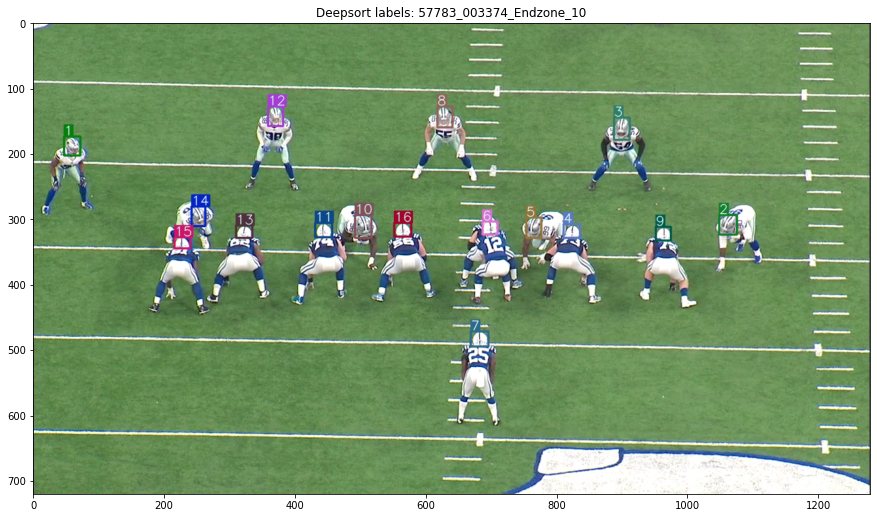


 33%|███▎      | 149/451 [01:15<04:15,  1.18it/s]

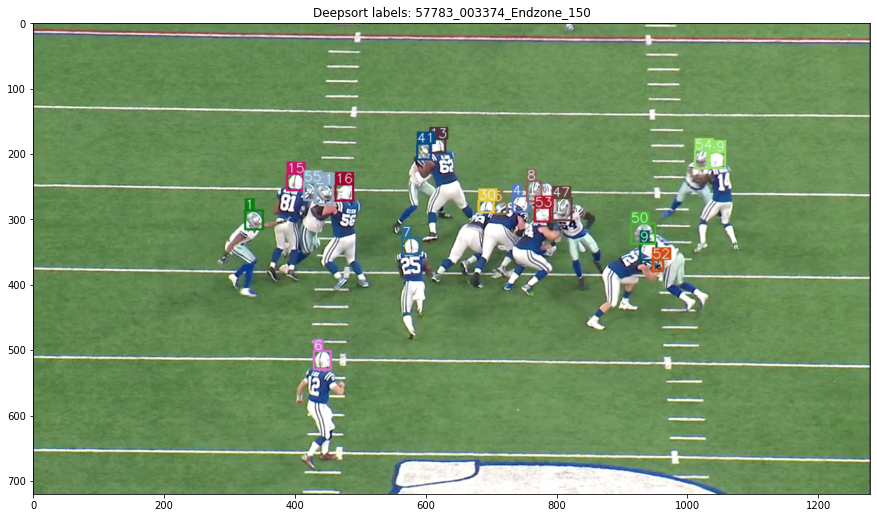


 55%|█████▌    | 249/451 [02:58<04:09,  1.24s/it]

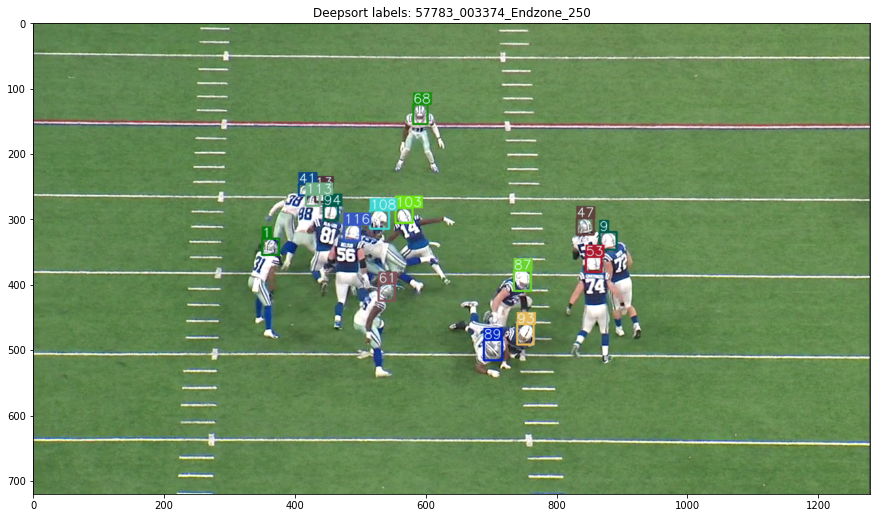


100%|██████████| 451/451 [05:20<00:00,  1.41it/s]


(7840, 13)
(7051, 13)


100%|██████████| 1/1 [05:25<00:00, 325.49s/it]

0.31414 before --> 0.72184 deepsort


In [38]:
# Add video and frame columns to submission.
submission_df['video'] = submission_df['video_frame'].str.split('_').str[:3].str.join('_')
submission_df['frame'] = submission_df['video_frame'].str.split('_').str[-1].astype('int')

if debug:
    video_dir = '../input/nfl-health-and-safety-helmet-assignment/train/'
else:
    video_dir = '../input/nfl-health-and-safety-helmet-assignment/test/'

# Loop through test videos and apply. If in debug mode show the score change.
outs = []
for myvideo, video_data in tqdm(submission_df.groupby('video'), total=submission_df['video'].nunique()):
    print(f'==== {myvideo} ====')
    if debug:
        # Plot deepsort labels when in debug mode.
        out = deepsort_helmets(video_data, video_dir, plot_frames=[10, 150, 250])
    else:
        out = deepsort_helmets(video_data, video_dir)        
    out = add_deepsort_label_col(out)
    outs.append(out)
    if debug:
        # Score
        score_vs_deepsort(myvideo, out, labels)
submission_deepsort = pd.concat(outs).copy()

# Check Submission & Save
Finally we will create a submission file and check that it passes the submission requirements.
The steps are:
1. Drop the `label` and replace with `label_deepsort` predictions.
2. Remove any duplicate labels within a single video/frame. This is required to meet the submission requirements.
3. Save the results.

In [39]:
ss = pd.read_csv('../input/nfl-health-and-safety-helmet-assignment/sample_submission.csv')
# Final Checks
submission_deepsort['label_deepsort'] = submission_deepsort['label_deepsort'] \
    .fillna(submission_deepsort['label'])
submission_deepsort = submission_deepsort.drop('label', axis=1) \
    .rename(columns={'label_deepsort':'label'})[ss.columns]
# Drop duplicate labels
submission_deepsort = submission_deepsort.loc[
    ~submission_deepsort[['video_frame','label']].duplicated()]
check_submission(submission_deepsort)

submission_deepsort.to_csv('submission.csv', index=False)

# Display video showing predictions

Lastly, if we want to review our predictions we can create a video to review the predictions using the `video_with_predictions` function from the `helmet_assignment` helper package.

In [40]:
from helmet_assignment.video import video_with_predictions
from IPython.display import Video, display

if debug:
    submission_deepsort['video'] = submission_deepsort['video_frame'].str.split('_').str[:3].str.join('_') + '.mp4'
    debug_videos = submission_deepsort['video'].unique()
    debug_labels = labels.query('video in @debug_videos')
    scorer = NFLAssignmentScorer(debug_labels)
    scorer.score(submission_deepsort)
    
    # Create video showing predictions for one of the videos.
    video_out = video_with_predictions(
        f'../input/nfl-health-and-safety-helmet-assignment/train/{debug_videos[0]}',
        scorer.sub_labels)
    
    frac = 0.60 # scaling factor for display
    display(Video(data=video_out,
                  embed=True,
                  height=int(720*frac),
                  width=int(1280*frac))
           )

Running for 57783_003374_Endzone


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
ffmpeg version 9c33b2f Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 9.3.0 (crosstool-NG 1.24.0.133_b0863d8_dirty)
  configuration: --prefix=/opt/conda --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-pic --enable-pthreads --enable-shared --enable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1627813612080/_build_env/bin/pkg-config
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libav